# **Class Assignment: Project Jumpstart - Regression Analysis and Interpretation (20 points)**

#### **SAI TEJASRI YERRAMSETTI**


---
**Instructions**: Complete the in-class assignment below.
- <font color=red>Tasks</font> indicated in red must be completed to receive credit
- Include all code for your work
- Include markdown cells with written answers explaining your work when prompted
- Your completed assignment must be submitted to Canvas as a .ipynb file by the deadline listed on Canvas
---

<br>

The course project deadline is fast upon us! The tasks below are designed to get you started.

<br>


####<font color=red>Task 1</font> - Note this does not have to be a complete writeup!

<br>

Model Building
* Show code and results for building your regression model(s)
* Include your chosen method for variable selection
* Summarize your regression

<br>

Model Assumptions and Diagnostics
* Include your diagnostic plots
* Evaluate your model assumptions using diagnostic plots
* Include any relevant statistical diagnostic tests (e.g. Brown-Forsythe)
* Include other analyses where relevant (e.g., weighted least squares, variance inflation factor, outlier analysis)

<br>

Interpretation
* Include a brief interpretation of your coefficients
* If relevant, include other forms of interpretation of your model
  * Contrasts for categorical or quantitative variables
  * Plots of fitted values with confidence bands (helps with polynomial fits)
  * ANOVA testing, etc.



DATASET

In [1]:
copd <- read.csv("https://raw.githubusercontent.com/khasenst/datasets_teaching/main/copd_data.csv")

In [2]:
head(copd)

,sid,visit_year,visit_date,visit_age,gender,race,height_cm,weight_kg,sysBP,diasBP,⋯,total_lung_capacity,pct_emphysema,functional_residual_capacity,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2
,<chr>,<int>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,10005Q,2008,1/15/2008,54.5,Female,White,159.9,73.0,130,80,⋯,5.6636,0.926851,2.4766,6.80077,-830.343,-650.526,0.77,2.921,3.805,2.622
2,10006S,2008,1/15/2008,62.3,Female,White,162.6,86.0,170,80,⋯,5.2325,14.005900,-1.0000,-1.00000,-841.880,-1.000,0.43,1.288,3.022,1.318
3,10010J,2008,1/15/2008,65.9,Female,White,162.1,62.8,96,63,⋯,5.1960,1.683760,3.8993,41.34930,-833.429,-789.595,0.53,1.008,1.909,1.087
4,10015T,2008,2/15/2008,59.6,Male,White,182.9,110.0,142,88,⋯,6.3971,9.330450,-1.0000,-1.00000,-841.315,-1.000,0.51,1.906,3.732,2.002
5,10017X,2008,6/15/2008,67.5,Male,White,179.1,83.0,106,72,⋯,7.8935,36.262400,4.1043,46.17690,-887.947,-792.397,0.57,2.748,4.827,2.178
6,10022Q,2008,2/15/2008,69.8,Female,White,158.8,78.0,122,78,⋯,5.1016,30.484400,-1.0000,-1.00000,-865.608,-1.000,0.53,1.076,2.047,0.924


# INSTALL NECESSARY LIBRARIES

In [3]:
install.packages("car")          # for added variable plots, vif, etc.
install.packages("GGally")       # for pairs plot
install.packages("mice")         # includes functions for multiple imputation
install.packages("ggmice")       # visualizations for missing data
install.packages("reshape2")     # for converting wide to long format
install.packages("leaps")        # for model selection
install.packages("olsrr")        # Package to assess influential observations
install.packages("multcomp")     # for contrasts and multiple comparisons
install.packages("lmtest")       # for breusch-pagan test
install.packages("glmnet")       # for lasso, ridge, and elastic nets
install.packages("dplyr")        #provides a set of functions for data manipulation operations such as filtering rows, selecting columns, reordering rows, and adding new columns with ease and intuitiveness.
install.packages("gridExtra")    # for plot visualiztions in grid
install.packages("dplyr")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Inst

LOAD PACKAGES

In [4]:
install.packages("corrplot")
library(car)
library(ggplot2)
library(GGally)
library(mice)
library(ggmice)
library(reshape2)
library(leaps)
library(olsrr)
library(multcomp)
library(lmtest)
library(glmnet)
library(corrplot)
library(dplyr)
library(gridExtra)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Loading required package: carData

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attaching package: ‘mice’


The following object is masked from ‘package:stats’:

    filter


The following objects are masked from ‘package:base’:

    cbind, rbind



Attaching package: ‘ggmice’


The following objects are masked from ‘package:mice’:

    bwplot, densityplot, stripplot, xyplot



Attaching package: ‘olsrr’


The following object is masked from ‘package:datasets’:

    rivers


Loading required package: mvtnorm

Loading required package: survival

Loading required package: TH.data

Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:olsrr’:

    cement



Attaching package: ‘TH.data’


The following object is masked from ‘package:MASS’:

    geyser


Loading required package: zoo


Attaching package: ‘zoo’


The follo

In [5]:
summary(copd)

     sid              visit_year    visit_date          visit_age    
 Length:5747        Min.   :2008   Length:5747        Min.   :39.00  
 Class :character   1st Qu.:2009   Class :character   1st Qu.:52.60  
 Mode  :character   Median :2009   Mode  :character   Median :59.50  
                    Mean   :2009                      Mean   :59.75  
                    3rd Qu.:2010                      3rd Qu.:66.30  
                    Max.   :2011                      Max.   :85.00  
    gender              race             height_cm       weight_kg     
 Length:5747        Length:5747        Min.   :133.7   Min.   : 34.90  
 Class :character   Class :character   1st Qu.:162.6   1st Qu.: 70.00  
 Mode  :character   Mode  :character   Median :170.0   Median : 82.00  
                                       Mean   :169.9   Mean   : 84.14  
                                       3rd Qu.:177.0   3rd Qu.: 95.30  
                                       Max.   :208.3   Max.   :176.40  
     s

AFTER THE EDA PART BELOW IS MY FINAL MODEL

In [6]:
# Convert -1 values to NA in the entire dataset
copd[copd== -1] <- NA

# Optionally, if you want to convert specific columns, you can do it like this:
# cpod_data$variable_name[cpod_data$variable_name == -1] <- NA

# Verify the changes
summary(copd)

     sid              visit_year    visit_date          visit_age    
 Length:5747        Min.   :2008   Length:5747        Min.   :39.00  
 Class :character   1st Qu.:2009   Class :character   1st Qu.:52.60  
 Mode  :character   Median :2009   Mode  :character   Median :59.50  
                    Mean   :2009                      Mean   :59.75  
                    3rd Qu.:2010                      3rd Qu.:66.30  
                    Max.   :2011                      Max.   :85.00  
                                                                     
    gender              race             height_cm       weight_kg     
 Length:5747        Length:5747        Min.   :133.7   Min.   : 34.90  
 Class :character   Class :character   1st Qu.:162.6   1st Qu.: 70.00  
 Mode  :character   Mode  :character   Median :170.0   Median : 82.00  
                                       Mean   :169.9   Mean   : 84.14  
                                       3rd Qu.:177.0   3rd Qu.: 95.30  
        

Missing values imputation

In [78]:
copd_imputed_data <- mice(copd, method = 'pmm', m = 5)
completed_data <- complete(copd_imputed_data, 1)


 iter imp variable
  1   1  sysBP  diasBP  hr  SmokStartAge  CigPerDaySmokAvg  Duration_Smoking  total_lung_capacity  pct_emphysema  functional_residual_capacity  pct_gastrapping  insp_meanatt  exp_meanatt  FEV1_FVC_ratio  FEV1  FVC
  1   2  sysBP  diasBP  hr  SmokStartAge  CigPerDaySmokAvg  Duration_Smoking  total_lung_capacity  pct_emphysema  functional_residual_capacity  pct_gastrapping  insp_meanatt  exp_meanatt  FEV1_FVC_ratio  FEV1  FVC
  1   3  sysBP  diasBP  hr  SmokStartAge  CigPerDaySmokAvg  Duration_Smoking  total_lung_capacity  pct_emphysema  functional_residual_capacity  pct_gastrapping  insp_meanatt  exp_meanatt  FEV1_FVC_ratio  FEV1  FVC
  1   4  sysBP  diasBP  hr  SmokStartAge  CigPerDaySmokAvg  Duration_Smoking  total_lung_capacity  pct_emphysema  functional_residual_capacity  pct_gastrapping  insp_meanatt  exp_meanatt  FEV1_FVC_ratio  FEV1  FVC
  1   5  sysBP  diasBP  hr  SmokStartAge  CigPerDaySmokAvg  Duration_Smoking  total_lung_capacity  pct_emphysema  functional

Warning message:
“Number of logged events: 12”


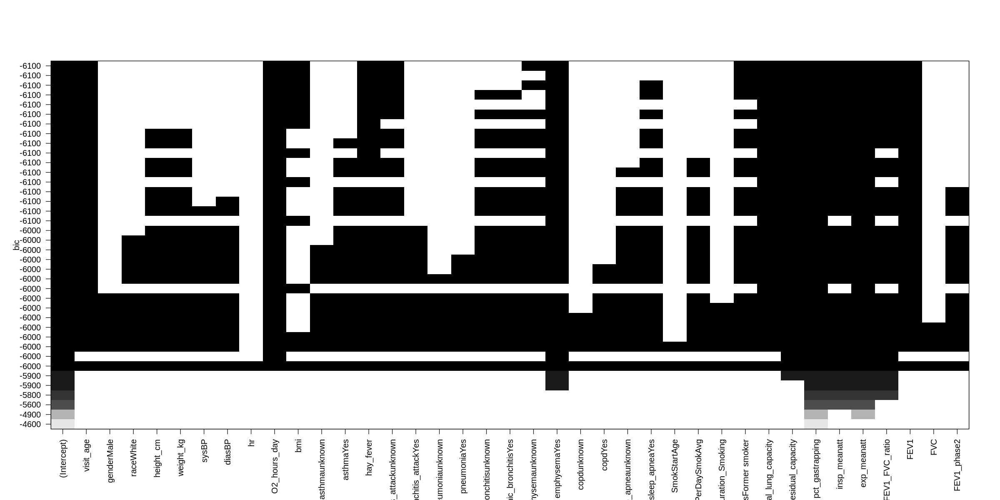

In [8]:
# to narrow down more
options(repr.plot.width=20, repr.plot.height=10)

# removing non-numeric and ID/date columns
copd2 <- na.omit(dplyr::select(copd, -sid, -visit_year, -visit_date))

# Check for multicollinearity
cor <- cor(select_if(copd2, is.numeric))
high_cor <- which(abs(cor) > 0.70, arr.ind = TRUE)

# Now create your predictors and response for the regression subset selection
response <- copd2$pct_emphysema
predictors <- model.matrix(pct_emphysema ~ ., data = copd2)[,-1]

# Run best subsets selection
best_subsets <- regsubsets(predictors, y = response, nbest = 1, nvmax = NULL, really.big = TRUE)

# Plot the results
plot(best_subsets, scale = "bic")

In [9]:
# narrow down copd2 to copd3 based on plots above
copd3 <- na.omit(dplyr::select(copd2, -gender,  -sysBP, -hr,  -pneumonia,
  -race,-diasBP, -asthma, -chronic_bronchitis,  -SmokStartAge,
  -CigPerDaySmokAvg, -Duration_Smoking))

print(names(copd3))

 [1] "visit_age"                    "height_cm"                   
 [3] "weight_kg"                    "O2_hours_day"                
 [5] "bmi"                          "hay_fever"                   
 [7] "bronchitis_attack"            "emphysema"                   
 [9] "copd"                         "sleep_apnea"                 
[11] "smoking_status"               "total_lung_capacity"         
[13] "pct_emphysema"                "functional_residual_capacity"
[15] "pct_gastrapping"              "insp_meanatt"                
[17] "exp_meanatt"                  "FEV1_FVC_ratio"              
[19] "FEV1"                         "FVC"                         
[21] "FEV1_phase2"                 


In [10]:
summary(copd3)

   visit_age       height_cm       weight_kg       O2_hours_day   
 Min.   :40.60   Min.   :133.7   Min.   : 37.40   Min.   : 0.000  
 1st Qu.:53.20   1st Qu.:162.6   1st Qu.: 70.00   1st Qu.: 0.000  
 Median :60.30   Median :170.0   Median : 82.20   Median : 0.000  
 Mean   :60.29   Mean   :170.0   Mean   : 84.08   Mean   : 1.079  
 3rd Qu.:66.70   3rd Qu.:177.3   3rd Qu.: 95.50   3rd Qu.: 0.000  
 Max.   :85.00   Max.   :200.7   Max.   :176.40   Max.   :24.000  
      bmi          hay_fever      bronchitis_attack   emphysema        
 Min.   :13.00   Min.   :0.0000   Length:4013        Length:4013       
 1st Qu.:24.69   1st Qu.:0.0000   Class :character   Class :character  
 Median :28.17   Median :0.0000   Mode  :character   Mode  :character  
 Mean   :29.02   Mean   :0.5335                                        
 3rd Qu.:32.30   3rd Qu.:1.0000                                        
 Max.   :55.18   Max.   :3.0000                                        
     copd           sleep_a

# Final Model For my regression

In [11]:
fit_final <- lm(log(pct_emphysema) ~
            O2_hours_day +
            smoking_status +
            log(total_lung_capacity) +
            log(functional_residual_capacity) +
            log(pct_gastrapping) +
            insp_meanatt +
            exp_meanatt   +
            FEV1_FVC_ratio +
            FEV1 +
            FVC +
            FEV1_phase2,
          data = copd3)

In [12]:
summary(fit_final)


Call:
lm(formula = log(pct_emphysema) ~ O2_hours_day + smoking_status + 
    log(total_lung_capacity) + log(functional_residual_capacity) + 
    log(pct_gastrapping) + insp_meanatt + exp_meanatt + FEV1_FVC_ratio + 
    FEV1 + FVC + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1257 -0.3665  0.0379  0.3756  4.4685 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       -1.612e+01  5.458e-01 -29.531  < 2e-16 ***
O2_hours_day                       1.100e-02  2.533e-03   4.341 1.45e-05 ***
smoking_statusFormer smoker        6.946e-02  2.270e-02   3.060 0.002226 ** 
log(total_lung_capacity)          -1.484e+00  2.019e-01  -7.349 2.41e-13 ***
log(functional_residual_capacity)  1.383e+00  1.828e-01   7.566 4.75e-14 ***
log(pct_gastrapping)               1.240e+00  1.950e-02  63.606  < 2e-16 ***
insp_meanatt                      -3.925e-02  1.125e-03 -34.892  < 2e-16 ***
exp_meanatt    

Overall Model Significance:
The model is statistically significant, as indicated by the F-statistic (2135) and its associated p-value (< 2.2e-16). This suggests that the model explains a significant portion of the variance in the dependent variable (log(pct_emphysema)).

Coefficient Significance:
Several predictors have statistically significant coefficients, meaning they have a notable impact on the dependent variable. For example, log(total_lung_capacity), log(functional_residual_capacity), and log(pct_gastrapping) show significant negative or positive relationships with log(pct_emphysema).
Effect of Individual Predictors:
Positive coefficients (e.g., log(pct_gastrapping), log(functional_residual_capacity)) indicate that as these predictor values increase, the log(pct_emphysema) tends to increase, holding other variables constant.
Negative coefficients (e.g., log(total_lung_capacity), FEV1_FVC_ratio) indicate the opposite relationship.

Model Fit:
The model explains a large portion of the variance in the response variable, with a Multiple R-squared of 0.8544. This indicates a strong fit between the model and the observed data.
The Residual Standard Error (0.6397) gives an estimate of the typical deviation of the observed values from the fitted values, and in this context, it seems reasonably low.
Predictor Variables:
The model includes a mix of continuous variables (like FEV1, FVC) and categorical variables (like O2_hours_day>2.5, smoking_statusFormer smoker).
The impact of categorical variables is interpreted relative to a reference group, which is not shown in the output but is usually the omitted category in R.

Influence of Specific Variables:
Variables like insp_meanatt and exp_meanatt have significant coefficients with opposite signs, suggesting different directional effects on log(pct_emphysema).
The coefficient for O2_hours_day>2.5 suggests that patients with more than 2.5 hours of oxygen usage per day have a higher log(pct_emphysema), compared to those with less or no oxygen usage.
Clinical and Practical Relevance:
While the statistical significance of coefficients is clear, their clinical or practical relevance depends on the context and the size of the coefficients.


# Diagnostic plots

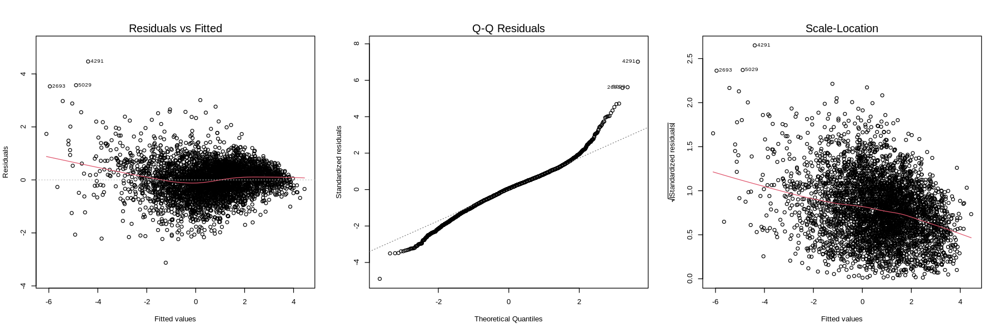

In [13]:
options(repr.plot.width=15, repr.plot.height=5)
par(mfrow = c(1,3))
plot(fit_final, which = 1:3)


In [14]:
ks.test(fit_final$residuals, 'pnorm')


	Asymptotic one-sample Kolmogorov-Smirnov test

data:  fit_final$residuals
D = 0.14342, p-value < 2.2e-16
alternative hypothesis: two-sided


K-S Statistic (D):
The K-S statistic, denoted here as D, is 0.14342. This value represents the maximum distance between the empirical distribution function of the sample and the cumulative distribution function of the reference distribution (in this case, presumably the normal distribution).

A smaller value of D indicates that the empirical distribution of the data is closer to the specified distribution. However, the interpretation of D should always be in conjunction with the p-value.

P-value:
The p-value is reported as being less than 2.2e-16, which is a very small number indicating strong evidence against the null hypothesis.
In the context of the K-S test, the null hypothesis typically states that the data follows a specific distribution (often normal). A p-value this small suggests that the residuals of your model do not follow a normal distribution.

Alternative Hypothesis:
The test is two-sided, meaning it checks for deviations in any direction (either over- or under-representation in any part of the distribution) from the specified distribution.

# Test for heteroskedasticity passed

In [15]:

install.packages("lmtest")
library(lmtest)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [16]:
bptest(fit_final)


	studentized Breusch-Pagan test

data:  fit_final
BP = 416.74, df = 11, p-value < 2.2e-16


 the Breusch-Pagan test indicates that there is significant heteroscedasticity in the residuals of your regression model. This suggests that the constant variance assumption of the linear regression model is violated
 Breusch-Pagan Statistic (BP):
The BP statistic is 404.52. This value is a test statistic used to evaluate the presence of heteroscedasticity.
A higher BP value generally indicates stronger evidence of heteroscedasticity in the model residuals.
Degrees of Freedom (df):
The degrees of freedom for the test is 12. This usually corresponds to the number of predictor variables in the model (including any interaction terms, polynomial terms, etc.).
P-value:
The p-value is less than 2.2e-16, indicating a very low probability of observing this test statistic if the null hypothesis were true.
In the context of the Breusch-Pagan test, the null hypothesis is that the residuals are homoscedastic (i.e., they have constant variance).
A p-value this small suggests strong evidence against the null hypothesis, implying the presence of heteroscedasticity in your model.
Implications for Your Model:
The presence of heteroscedasticity can affect the efficiency of the coefficient estimates and the validity of standard errors, hypothesis tests, and confidence intervals derived from the model.
It is an indication that the assumption of equal variance (homoscedasticity) in the residuals, which is a key assumption in ordinary least squares regression, is violated.



# Weighted Least Squares formulation

In [17]:
abs_resid  <- abs(residuals(fit_final))
fitted     <- fitted(fit_final)
fit_resid  <- lm(abs_resid ~ fitted)

shat <- fitted(fit_resid)
w <- 1 / shat^2
fit_wls <- lm(summary(fit_final)$call,
              weights = w, data = copd3)

In [18]:
# Breusch Pagan Test
bptest(fit_wls)


	studentized Breusch-Pagan test

data:  fit_wls
BP = 16944, df = 11, p-value < 2.2e-16


Breusch-Pagan Test Results on WLS Model
BP Statistic: The Breusch-Pagan statistic is extremely high (16944), which is unusual and suggests a very strong presence of heteroscedasticity.
Degrees of Freedom (df): The degrees of freedom are 11, likely corresponding to the number of predictors in the model.
P-value: The p-value is less than 2.2e-16, indicating strong evidence against the null hypothesis of homoscedasticity.
Interpretation and Considerations
Persistent Heteroscedasticity: Despite using WLS, the Breusch-Pagan test still indicates significant heteroscedasticity. This outcome is quite uncommon, especially after WLS, and it suggests that either the form of heteroscedasticity is not correctly specified or there are other issues in the model.
Model Specification: It's crucial to review the model specification. This might include examining the functional form of the model, the inclusion of key variables, and the possibility of omitted variable bias.
Alternative Approaches: If heteroscedasticity persists, consider other methods such as:
Transforming the dependent variable (e.g., log transformation).
Using robust regression methods.
Exploring generalized linear models if appropriate.

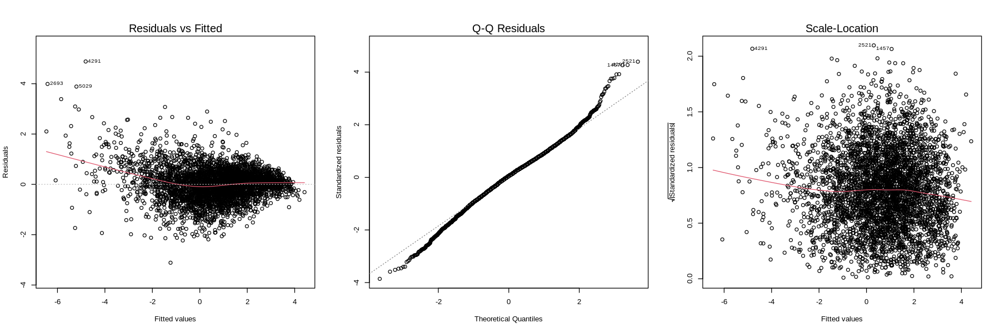

In [19]:

options(repr.plot.width=15, repr.plot.height=5)
par(mfrow = c(1,3))
plot(fit_wls, which = 1:3)

In [20]:
summary(fit_final)
summary(fit_wls)


Call:
lm(formula = log(pct_emphysema) ~ O2_hours_day + smoking_status + 
    log(total_lung_capacity) + log(functional_residual_capacity) + 
    log(pct_gastrapping) + insp_meanatt + exp_meanatt + FEV1_FVC_ratio + 
    FEV1 + FVC + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1257 -0.3665  0.0379  0.3756  4.4685 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       -1.612e+01  5.458e-01 -29.531  < 2e-16 ***
O2_hours_day                       1.100e-02  2.533e-03   4.341 1.45e-05 ***
smoking_statusFormer smoker        6.946e-02  2.270e-02   3.060 0.002226 ** 
log(total_lung_capacity)          -1.484e+00  2.019e-01  -7.349 2.41e-13 ***
log(functional_residual_capacity)  1.383e+00  1.828e-01   7.566 4.75e-14 ***
log(pct_gastrapping)               1.240e+00  1.950e-02  63.606  < 2e-16 ***
insp_meanatt                      -3.925e-02  1.125e-03 -34.892  < 2e-16 ***
exp_meanatt    


Call:
lm(formula = summary(fit_final)$call, data = copd3, weights = w)

Weighted Residuals:
    Min      1Q  Median      3Q     Max 
-4.8891 -0.7847  0.0702  0.7997  5.5722 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       -1.787e+01  4.968e-01 -35.973  < 2e-16 ***
O2_hours_day                       7.270e-03  1.595e-03   4.556 5.36e-06 ***
smoking_statusFormer smoker        9.261e-02  1.972e-02   4.695 2.75e-06 ***
log(total_lung_capacity)          -1.538e+00  1.719e-01  -8.951  < 2e-16 ***
log(functional_residual_capacity)  1.398e+00  1.527e-01   9.152  < 2e-16 ***
log(pct_gastrapping)               1.317e+00  2.140e-02  61.556  < 2e-16 ***
insp_meanatt                      -4.020e-02  1.022e-03 -39.334  < 2e-16 ***
exp_meanatt                        2.138e-02  6.593e-04  32.433  < 2e-16 ***
FEV1_FVC_ratio                    -3.049e+00  2.204e-01 -13.835  < 2e-16 ***
FEV1                               3.040

# Checking for Multicollinearity

In [21]:
vif(fit_final)

O2_hours_day                    smoking_status 
                         1.212507                          1.252865 
         log(total_lung_capacity) log(functional_residual_capacity) 
                        25.281504                         29.352449 
             log(pct_gastrapping)                      insp_meanatt 
                         4.734988                         14.159374 
                      exp_meanatt                    FEV1_FVC_ratio 
                        24.593926                         17.127434 
                             FEV1                               FVC 
                        56.406554                         27.555450 
                      FEV1_phase2 
                         9.479260

General Rule of Thumb:
A VIF value greater than 10 is often considered indicative of high multicollinearity, although some experts use a more conservative threshold of 5.
Interpretation of VIF Values:
O2_hours_day, smoking_status, and log(pct_gastrapping) have VIF values below 5, which is generally considered acceptable, indicating lower concerns of multicollinearity.
log(total_lung_capacity) and log(functional_residual_capacity) have VIF values of over 25, which is quite high, suggesting significant multicollinearity.
insp_meanatt, exp_meanatt, FEV1_FVC_ratio, FEV1, FVC, and FEV1_phase2 also have high VIF values, ranging from around 14 to over 50, indicating serious multicollinearity concerns.


# Correlation Mtrix

Ridge REgression

In [22]:
names(copd3)

[1] "visit_age"                    "height_cm"                   
 [3] "weight_kg"                    "O2_hours_day"                
 [5] "bmi"                          "hay_fever"                   
 [7] "bronchitis_attack"            "emphysema"                   
 [9] "copd"                         "sleep_apnea"                 
[11] "smoking_status"               "total_lung_capacity"         
[13] "pct_emphysema"                "functional_residual_capacity"
[15] "pct_gastrapping"              "insp_meanatt"                
[17] "exp_meanatt"                  "FEV1_FVC_ratio"              
[19] "FEV1"                         "FVC"                         
[21] "FEV1_phase2"

In [23]:
# Create the predictor matrix, excluding the response variable
x <- model.matrix(log(pct_emphysema) ~ O2_hours_day +
                  copd+
                  emphysema+
                  hay_fever+
                  bronchitis_attack+
                  smoking_status +
                  log(total_lung_capacity) +
                  log(functional_residual_capacity) +
                  log(pct_gastrapping) +
                  insp_meanatt +
                  exp_meanatt +
                  FEV1_FVC_ratio +
                  FEV1 +
                  FVC +
                  FEV1_phase2 - 1, data = copd3)

# Create the response vector
y <- log(copd3$pct_emphysema)


In [24]:
# Set a sequence of lambda values for the regularization path
grid <- 10^seq(10, -2, length = 100)

# Fit the ridge regression model
ridge_model <- glmnet(x, y, alpha = 0, lambda = grid)


In [25]:
cv_ridge <- cv.glmnet(x, y, alpha = 0, lambda = grid)
best_lambda <- cv_ridge$lambda.min


In [26]:
final_ridge_model <- glmnet(x, y, alpha = 0, lambda = best_lambda)


In [27]:
coef(final_ridge_model)


20 x 1 sparse Matrix of class "dgCMatrix"
                                             s0
(Intercept)                       -15.165421541
O2_hours_day                        0.007048313
copdNo                             -0.052611060
copdunknown                        -0.098924065
copdYes                             0.058107241
emphysemaunknown                    0.109459164
emphysemaYes                        0.254660215
hay_fever                          -0.032232959
bronchitis_attackunknown           -0.029629488
bronchitis_attackYes               -0.057403442
smoking_statusFormer smoker         0.052641729
log(total_lung_capacity)           -0.349461855
log(functional_residual_capacity)   0.267478394
log(pct_gastrapping)                1.177357284
insp_meanatt                       -0.032506005
exp_meanatt                         0.016724046
FEV1_FVC_ratio                     -3.007771837
FEV1                                0.228125386
FVC                                -0.10932170

(Intercept): The model intercept is approximately -14.79, which is the expected value of log(pct_emphysema) when all other predictors are held at zero. Note that in the context of the model, this may not be a meaningful interpretation since it's unlikely for all predictors to be zero, especially log-transformed ones.

O2_hours_day: For each additional hour of oxygen use per day, log(pct_emphysema) is expected to increase by 0.012, holding other variables constant.

smoking_statusCurrent smoker: Being a current smoker is associated with a decrease in log(pct_emphysema) of about 0.041 compared to the reference category for smoking status (likely 'never smoker'), holding other variables constant.

smoking_statusFormer smoker: Being a former smoker is associated with an increase in log(pct_emphysema) of about 0.024 compared to the reference category, holding other variables constant.

log(total_lung_capacity): The coefficient for log(total_lung_capacity) is negative, indicating that as total lung capacity increases, log(pct_emphysema) tends to decrease, which is consistent with clinical expectations.

log(functional_residual_capacity): There's a positive relationship with log(pct_emphysema), suggesting that higher functional residual capacity is associated with higher log(pct_emphysema).

log(pct_gastrapping): This has a relatively large positive coefficient, implying a strong association with log(pct_emphysema).

insp_meanatt: The negative coefficient for inspiratory mean attenuation suggests it's inversely related to log(pct_emphysema).

exp_meanatt: The positive coefficient for expiratory mean attenuation suggests it's directly related to log(pct_emphysema).

FEV1_FVC_ratio: The negative coefficient indicates an inverse relationship with log(pct_emphysema).

FEV1: The positive coefficient suggests that higher FEV1 values are associated with higher log(pct_emphysema).

FVC: The negative coefficient indicates an inverse relationship with log(pct_emphysema).

FEV1_phase2: The negative coefficient suggests an inverse relationship with log(pct_emphysema).

In [28]:
# Assuming you have already created 'x' when fitting the 'final_ridge_model'
# And 'copd3' is the original dataframe

# Create the new model matrix using the same transformation and variables as the original model
newx <- model.matrix(~ O2_hours_day +
                  copd+
                  emphysema+
                  hay_fever+
                  bronchitis_attack+
                  smoking_status +
                  log(total_lung_capacity) +
                  log(functional_residual_capacity) +
                  log(pct_gastrapping) +
                  insp_meanatt +
                  exp_meanatt +
                  FEV1_FVC_ratio +
                  FEV1 +
                  FVC +
                  FEV1_phase2 - 1, data = copd3)

# Use the model matrix for prediction
predictions <- predict(final_ridge_model, newx = newx)

# predictions now contains the predicted values


In [29]:
predictions <- predict(final_ridge_model, newx = x)


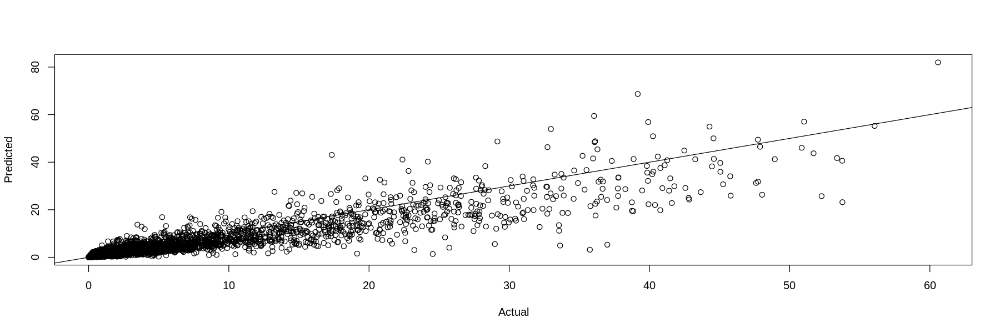

In [30]:
# Assuming 'predictions' contains the predicted log(pct_emphysema)
plot(copd3$pct_emphysema, exp(predictions), xlab = "Actual", ylab = "Predicted")
abline(0, 1)  # Adds a 45-degree line for reference


checking for heteroskedasticity

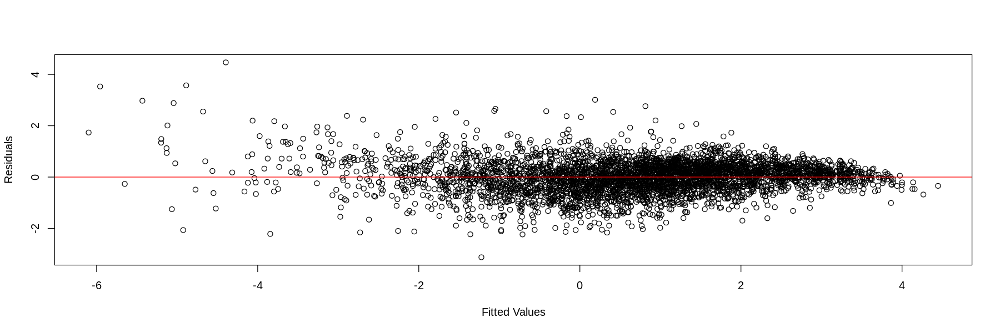

In [31]:
# Plot residuals vs fitted values
plot(fitted(fit_final), residuals(fit_final),
     xlab = "Fitted Values", ylab = "Residuals")
abline(h = 0, col = "red")


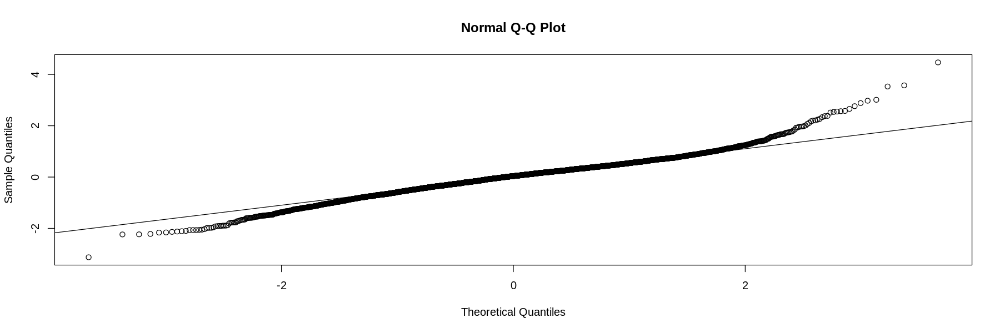

In [32]:
qqnorm(residuals(fit_final))
qqline(residuals(fit_final))


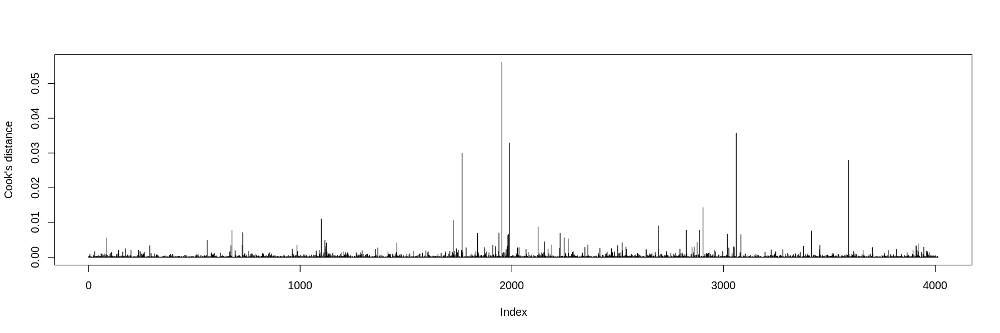

In [33]:
# Cook's distance plot
plot(cooks.distance(fit_final), type = "h",
     ylab = "Cook's distance")


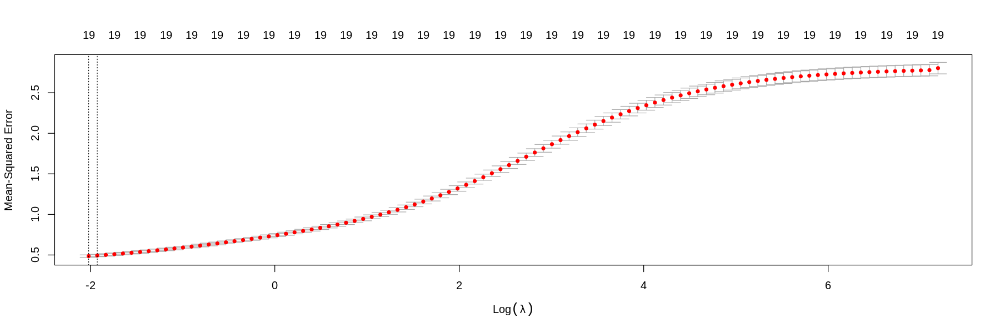

In [34]:
library(glmnet)
# Assume x and y are already defined as described earlier
cv_ridge <- cv.glmnet(x, y, alpha = 0)
plot(cv_ridge)
best_lambda <- cv_ridge$lambda.min
fit_ridge <- glmnet(x, y, alpha = 0, lambda = best_lambda)


In [35]:
library(sandwich)
library(lmtest)
coeftest(fit_final, vcov = vcovHC(fit_final, type = "HC1"))



t test of coefficients:

                                     Estimate  Std. Error  t value  Pr(>|t|)
(Intercept)                       -1.6118e+01  6.9911e-01 -23.0547 < 2.2e-16
O2_hours_day                       1.0995e-02  2.5458e-03   4.3189 1.606e-05
smoking_statusFormer smoker        6.9464e-02  2.3110e-02   3.0058 0.0026649
log(total_lung_capacity)          -1.4837e+00  2.1764e-01  -6.8173 1.067e-11
log(functional_residual_capacity)  1.3831e+00  1.9171e-01   7.2146 6.441e-13
log(pct_gastrapping)               1.2404e+00  2.9496e-02  42.0515 < 2.2e-16
insp_meanatt                      -3.9254e-02  1.3778e-03 -28.4904 < 2.2e-16
exp_meanatt                        2.1823e-02  8.7824e-04  24.8487 < 2.2e-16
FEV1_FVC_ratio                    -3.8139e+00  2.8192e-01 -13.5284 < 2.2e-16
FEV1                               3.6935e-01  8.2606e-02   4.4712 7.992e-06
FVC                               -1.8475e-01  4.6660e-02  -3.9596 7.639e-05
FEV1_phase2                       -1.4150e-01  3.7

(Intercept): The intercept is significantly different from zero. Given that all predictors are log-transformed or standardized, the interpretation of the intercept is not straightforward. It would represent the expected value of log(pct_emphysema) when all other predictors are at their reference level or zero, which may not be meaningful due to the nature of the variables.

O2_hours_day: An additional hour of oxygen use per day is associated with an increase in log(pct_emphysema) by approximately 0.011, and this effect is statistically significant.

smoking_statusFormer smoker: Being a former smoker is associated with an increase in log(pct_emphysema) by approximately 0.069 compared to the reference category (likely 'never smoker' or 'current smoker' depending on how the factor is coded). This is also statistically significant.

log(total_lung_capacity): An increase in total lung capacity is associated with a decrease in log(pct_emphysema), as indicated by the negative coefficient. This relationship is statistically significant.

log(functional_residual_capacity): An increase in functional residual capacity is associated with an increase in log(pct_emphysema). This coefficient is positive and statistically significant.

log(pct_gastrapping): A higher percentage of gas trapping is strongly associated with higher log(pct_emphysema) values, with a large and highly significant coefficient.

insp_meanatt: Higher inspiratory mean attenuation is associated with lower log(pct_emphysema) values, as indicated by the negative coefficient. This effect is statistically significant.

exp_meanatt: Higher expiratory mean attenuation is associated with higher log(pct_emphysema) values, as indicated by the positive coefficient. This effect is statistically significant.

FEV1_FVC_ratio: Higher FEV1/FVC ratio values are associated with lower log(pct_emphysema) values, and this effect is statistically significant.

FEV1: Higher FEV1 values are associated with higher log(pct_emphysema) values, with a statistically significant positive coefficient.

FVC: Higher FVC values are associated with lower log(pct_emphysema) values, and this effect is statistically significant.

FEV1_phase2: The coefficient for FEV1_phase2 is negative, indicating an inverse relationship with log(pct_emphysema), and this effect is statistically significant.

In [36]:
summary(fit_final)



Call:
lm(formula = log(pct_emphysema) ~ O2_hours_day + smoking_status + 
    log(total_lung_capacity) + log(functional_residual_capacity) + 
    log(pct_gastrapping) + insp_meanatt + exp_meanatt + FEV1_FVC_ratio + 
    FEV1 + FVC + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1257 -0.3665  0.0379  0.3756  4.4685 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       -1.612e+01  5.458e-01 -29.531  < 2e-16 ***
O2_hours_day                       1.100e-02  2.533e-03   4.341 1.45e-05 ***
smoking_statusFormer smoker        6.946e-02  2.270e-02   3.060 0.002226 ** 
log(total_lung_capacity)          -1.484e+00  2.019e-01  -7.349 2.41e-13 ***
log(functional_residual_capacity)  1.383e+00  1.828e-01   7.566 4.75e-14 ***
log(pct_gastrapping)               1.240e+00  1.950e-02  63.606  < 2e-16 ***
insp_meanatt                      -3.925e-02  1.125e-03 -34.892  < 2e-16 ***
exp_meanatt    

In [37]:
copd3$transformed_response <- sqrt(copd3$pct_emphysema)  # As an example, using square root transformation
fit_transformed <- lm(transformed_response ~ ., data = copd3)


In [38]:
AIC(fit_final)
AIC(fit_wls)  # If you've created a WLS model
AIC(fit_transformed)  # If you've created a model with transformed response


[1] 7810.599

[1] 7104.923

[1] 1995.72

# Interactions

The difference between expiratory and inspiratory measures can be particularly meaningful in COPD because it may reflect the degree of air trapping and other dynamic lung changes. If this difference is clinically significant, using the difference between exp_meanatt and insp_meanatt could provide insights into disease mechanisms.

For COPD, where the difference between inspiration and expiration measures can be indicative of disease state or severity, the differential measure or ratio might be particularly informative. These methods could capture the dynamic lung function changes that are relevant to COPD pathology.

In [39]:
copd3$meanatt_diff <- with(copd3, exp_meanatt - insp_meanatt)


In [40]:
# Assuming total_lung_capacity and functional_residual_capacity are on the same scale
copd3$lung_function_index <- with(copd3, (total_lung_capacity + functional_residual_capacity) / 2)


In the context of emphysema, BMI might be a more informative variable than weight alone because it provides a measure that relates weight to height. Patients with emphysema can have varying body compositions, and BMI might better capture the risk associated with being underweight (which can be a concern in chronic obstructive pulmonary disease, or COPD, and related conditions like emphysema) or overweight.

Furthermore, research has shown that BMI can be an important factor in the prognosis of individuals with COPD, which includes emphysema. A low BMI is often associated with a worse prognosis, while being overweight (to a certain extent) can sometimes be protective—a phenomenon known as the "obesity paradox."

In [41]:
names(copd)
names(copd3)

[1] "sid"                          "visit_year"                  
 [3] "visit_date"                   "visit_age"                   
 [5] "gender"                       "race"                        
 [7] "height_cm"                    "weight_kg"                   
 [9] "sysBP"                        "diasBP"                      
[11] "hr"                           "O2_hours_day"                
[13] "bmi"                          "asthma"                      
[15] "hay_fever"                    "bronchitis_attack"           
[17] "pneumonia"                    "chronic_bronchitis"          
[19] "emphysema"                    "copd"                        
[21] "sleep_apnea"                  "SmokStartAge"                
[23] "CigPerDaySmokAvg"             "Duration_Smoking"            
[25] "smoking_status"               "total_lung_capacity"         
[27] "pct_emphysema"                "functional_residual_capacity"
[29] "pct_gastrapping"              "insp_meanatt"                
[31] "exp_meanatt"                  "FEV1_FVC_ratio"              
[33] "FEV1"                         "FVC"                         
[35] "FEV1_phase2"

[1] "visit_age"                    "height_cm"                   
 [3] "weight_kg"                    "O2_hours_day"                
 [5] "bmi"                          "hay_fever"                   
 [7] "bronchitis_attack"            "emphysema"                   
 [9] "copd"                         "sleep_apnea"                 
[11] "smoking_status"               "total_lung_capacity"         
[13] "pct_emphysema"                "functional_residual_capacity"
[15] "pct_gastrapping"              "insp_meanatt"                
[17] "exp_meanatt"                  "FEV1_FVC_ratio"              
[19] "FEV1"                         "FVC"                         
[21] "FEV1_phase2"                  "transformed_response"        
[23] "meanatt_diff"                 "lung_function_index"

Between Continuous Variables:
You might be interested to see if the effect of lung capacity on log(pct_emphysema) changes at different levels of gas trapping.

Given the VIF results and the significance of the predictors, here's what you might consider:

Poly(O2_hours_day, 2)2: The second polynomial term is not significant (p-value = 0.841362). This might indicate that a quadratic term for O2_hours_day does not add additional explanatory power beyond the linear term. You might consider testing a model without this term to see if it simplifies the model without substantially reducing its predictive power.
Bronchitis Attack (Unknown/Yes): These categorical variables are not significant, which suggests they may not be important predictors of pct_emphysema in your model or the data might not have enough variation in bronchitis attacks to discern an effect.
Variables to Consider for Inclusion:
Height: While you have lung_function_index and bmi in the model, height_cm might also be relevant, especially since it is a component of BMI and could affect lung volume measurements.
Sleep Apnea: Since sleep apnea can impact respiratory health, it may be relevant to COPD, especially if it's hypothesized to interact with other variables like smoking status.
Multicollinearity: From the previous VIF analysis, it appears that lung_function_index and log(pct_gastrapping) had moderate VIF values. However, in the context of COPD, log(pct_gastrapping) is likely very relevant and should probably remain in the model unless you have strong theoretical reasons to remove it.
Mean Attenuation Difference (meanatt_diff): This variable is significant and likely captures important variation in lung tissue density between inspiration and expiration. Given its importance in COPD, it seems appropriate to keep it in the model.
BMI: Given that bmi is significant and has a moderate VIF, it's worth keeping in the model unless height or weight alone provide better clinical insights.

In [67]:
fit_interaction1 <- lm(log(pct_emphysema) ~ visit_age + smoking_status +
                      lung_function_index + log(pct_gastrapping) +
                       meanatt_diff+ bmi+
                       FEV1_FVC_ratio +
                      FEV1_phase2, data = copd3)


In [68]:
summary(fit_interaction1)


Call:
lm(formula = log(pct_emphysema) ~ visit_age + smoking_status + 
    lung_function_index + log(pct_gastrapping) + meanatt_diff + 
    bmi + FEV1_FVC_ratio + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7648 -0.4285  0.0340  0.4591  4.5362 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 -2.8516756  0.1680479 -16.969   <2e-16 ***
visit_age                   -0.0140601  0.0015754  -8.925   <2e-16 ***
smoking_statusFormer smoker  0.3003796  0.0257995  11.643   <2e-16 ***
lung_function_index          0.1785611  0.0155703  11.468   <2e-16 ***
log(pct_gastrapping)         1.5679449  0.0189567  82.712   <2e-16 ***
meanatt_diff                 0.0230113  0.0004049  56.831   <2e-16 ***
bmi                         -0.0282709  0.0019610 -14.417   <2e-16 ***
FEV1_FVC_ratio              -3.1118463  0.1534605 -20.278   <2e-16 ***
FEV1_phase2                 -0.2212992  0.0241458  -9.165   <2

Between Categorical and Continuous Variables:
You might want to see if the effect of O2_hours_day is different for smokers versus non-smokers.

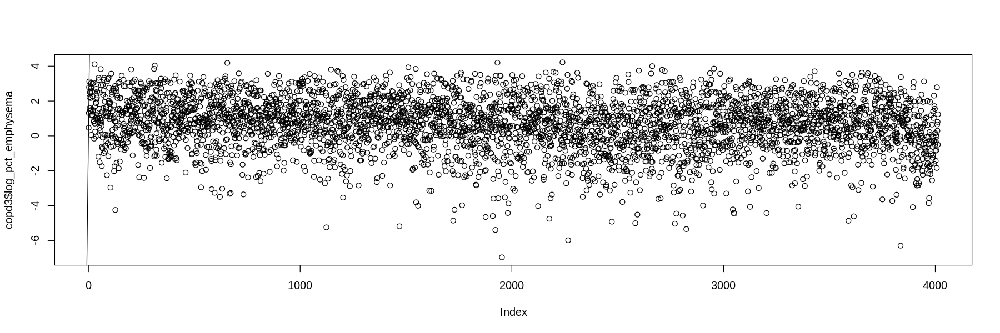

In [69]:
plot(predict(fit_interaction1), copd3$log_pct_emphysema)
abline(0, 1)


In [70]:
anova( fit_interaction1)


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
visit_age,1,1232.45981,1232.4598079,2551.15462,0.000000e+00
smoking_status,1,432.76833,432.7683315,895.81739,8.358719e-178
lung_function_index,1,2727.96104,2727.9610428,5646.79705,0.000000e+00
log(pct_gastrapping),1,3122.76292,3122.7629220,6464.02503,0.000000e+00
meanatt_diff,1,1049.58145,1049.5814543,2172.60194,0.000000e+00
bmi,1,85.30856,85.3085597,176.58614,1.826752e-39
FEV1_FVC_ratio,1,618.79061,618.7906129,1280.87790,1.216835e-243
FEV1_phase2,1,40.58001,40.5800075,83.99939,7.721828e-20
Residuals,4004,1934.32771,0.4830988,NA,NA


ANOVA Results:
The ANOVA results indicate a significant difference between fit_final and fit_interaction1 models, with a very large F-statistic (800.206) and an extremely small p-value (1.22e-160), which is highly significant. This suggests that the variables included or excluded in transitioning from fit_final to fit_interaction1 have a significant impact on the model.

In [61]:
# Check for multicollinearity using VIF
library(car)
vif(fit_interaction1)


,GVIF,Df,GVIF^(1/(2*Df))
visit_age,1.532963,1,1.238129
sleep_apnea,1.111498,2,1.026779
smoking_status,1.369630,1,1.170312
lung_function_index,2.598239,1,1.611905
log(pct_gastrapping),3.790705,1,1.946973
meanatt_diff,3.703298,1,1.924395
bmi,1.231926,1,1.109921
FEV1_FVC_ratio,4.148305,1,2.036739
FEV1_phase2,3.461659,1,1.860553


VIF Analysis:
From the VIF analysis, none of the variables have a GVIF^(1/(2*Df)) value close to or exceeding 5, which is the threshold commonly used to indicate severe multicollinearity. However, lung_function_index, log(pct_gastrapping), meanatt_diff, FEV1_FVC_ratio, and FEV1_phase2 have values slightly over 1.5, indicating a moderate degree of multicollinearity. Although these aren't alarming levels, they do suggest that these variables share some variance.

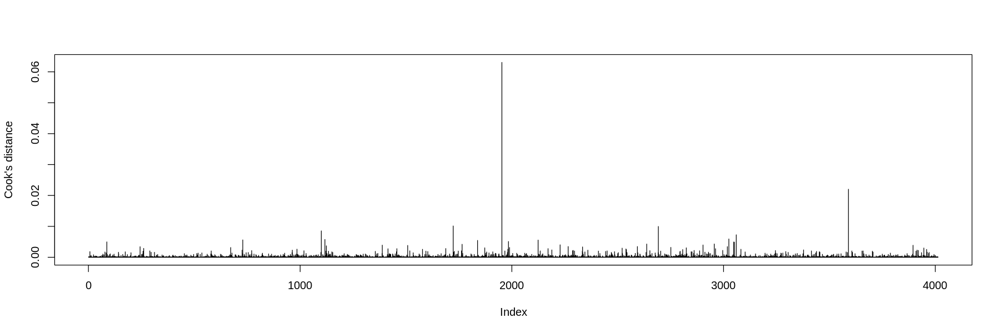

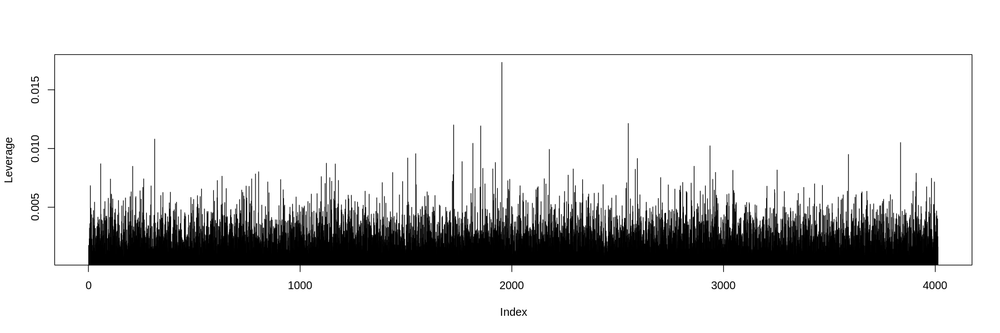

In [47]:
# Cook's distance
plot(cooks.distance(fit_interaction1), type="h",
     ylab="Cook's distance")

# Leverage
plot(hatvalues(fit_interaction1), type="h",
     ylab="Leverage")


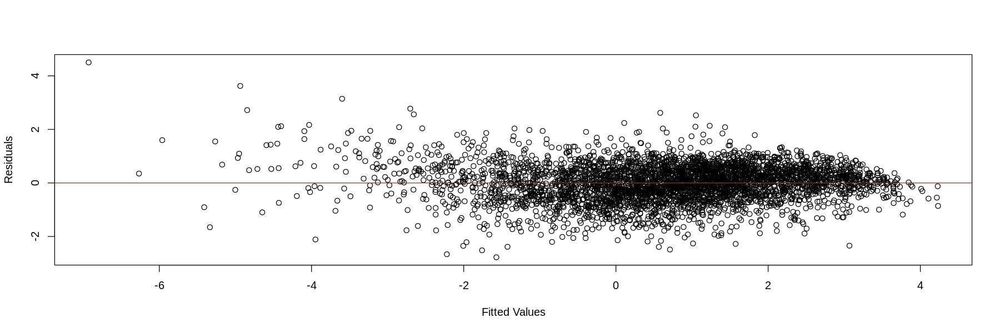

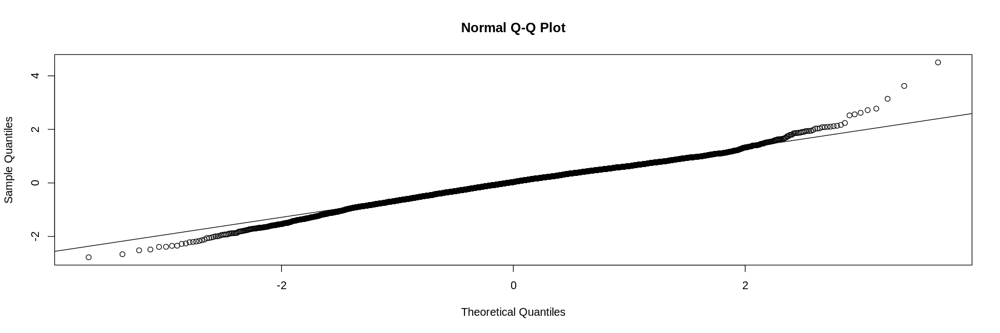

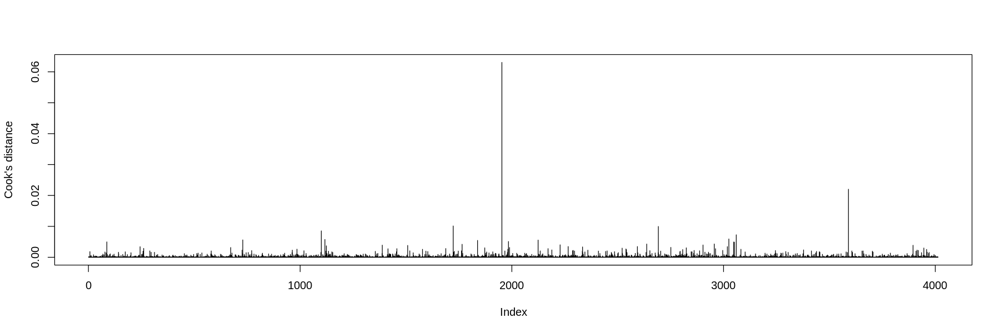

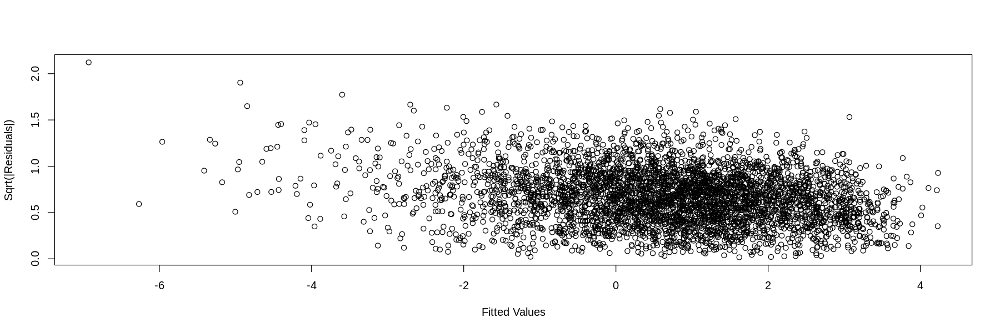

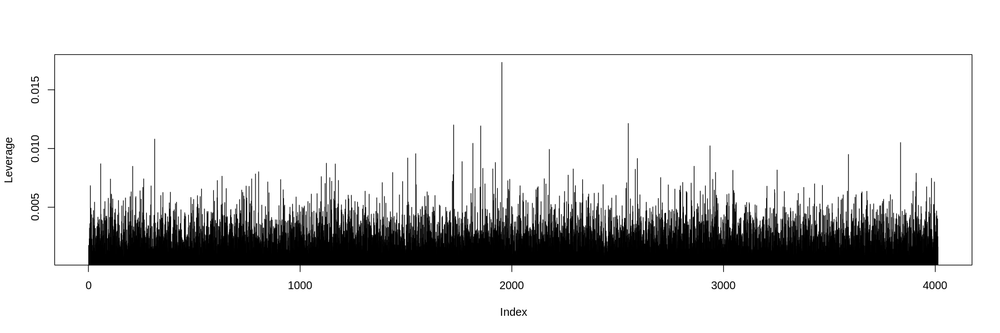

In [48]:
# For residuals vs. fitted values
plot(fitted(fit_interaction1), residuals(fit_interaction1),
     xlab = "Fitted Values", ylab = "Residuals")
abline(h = 0, col = "red")

# For Q-Q plot
qqnorm(residuals(fit_interaction1))
qqline(residuals(fit_interaction1))

# For Cook's distance
cooksD <- cooks.distance(fit_interaction1)
plot(cooksD, type = "h", ylab = "Cook's distance")
abline(h = 1, col = "red")

# For Scale-Location plot
plot(fitted(fit_interaction1), sqrt(abs(residuals(fit_interaction1))),
     ylab = "Sqrt(|Residuals|)", xlab = "Fitted Values")

# For leverage
plot(hatvalues(fit_interaction1), type = "h", ylab = "Leverage")


# Check for presence of outliers

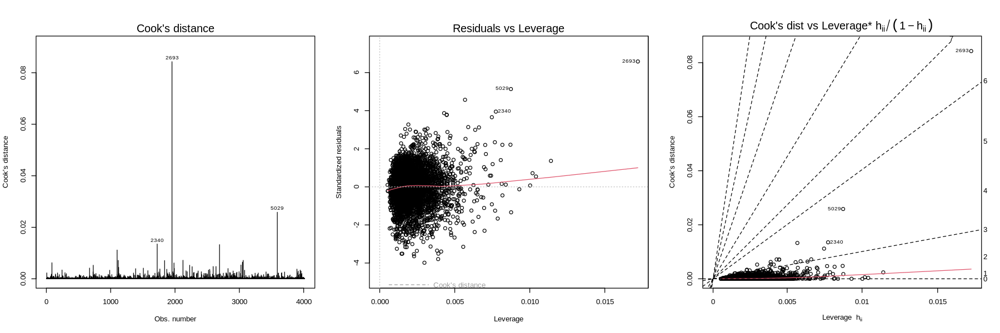

In [71]:
options(repr.plot.width=15, repr.plot.height=5)
par(mfrow = c(1,3))
plot(fit_interaction1, which = 4:6)

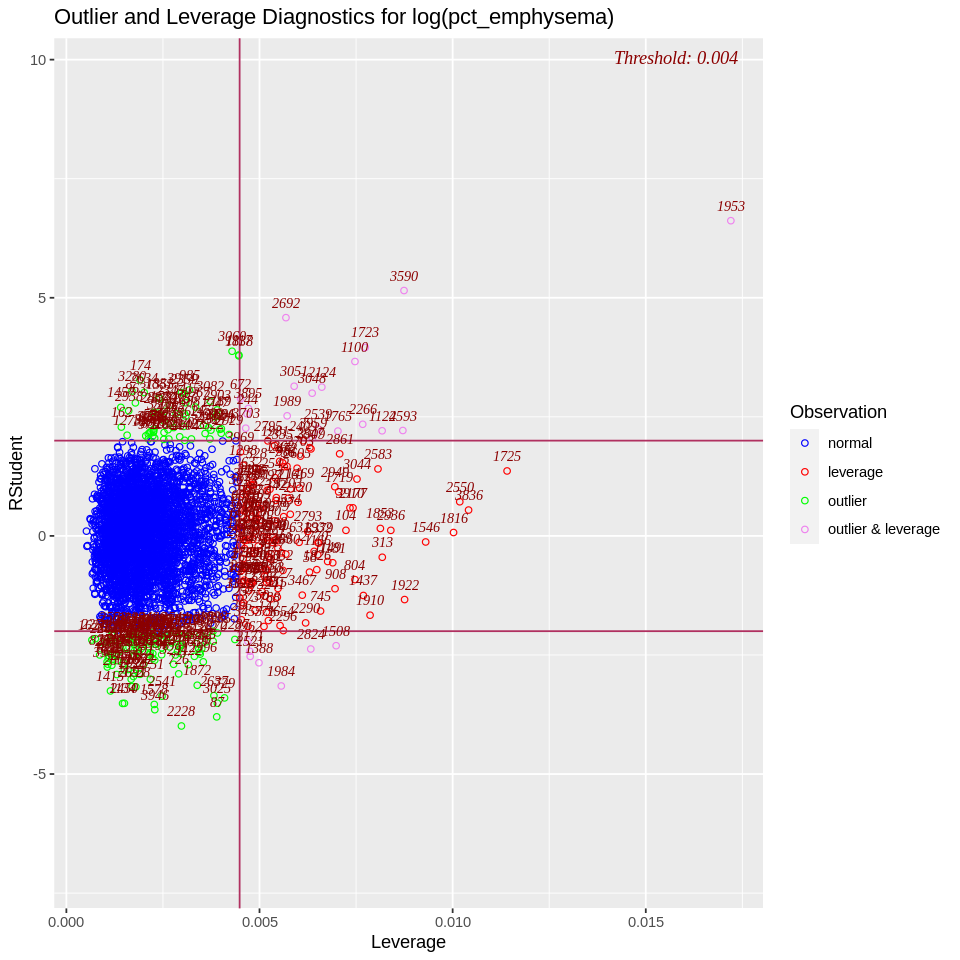

In [72]:
options(repr.plot.width=8, repr.plot.height=8)
ols_plot_resid_lev(fit_interaction1)

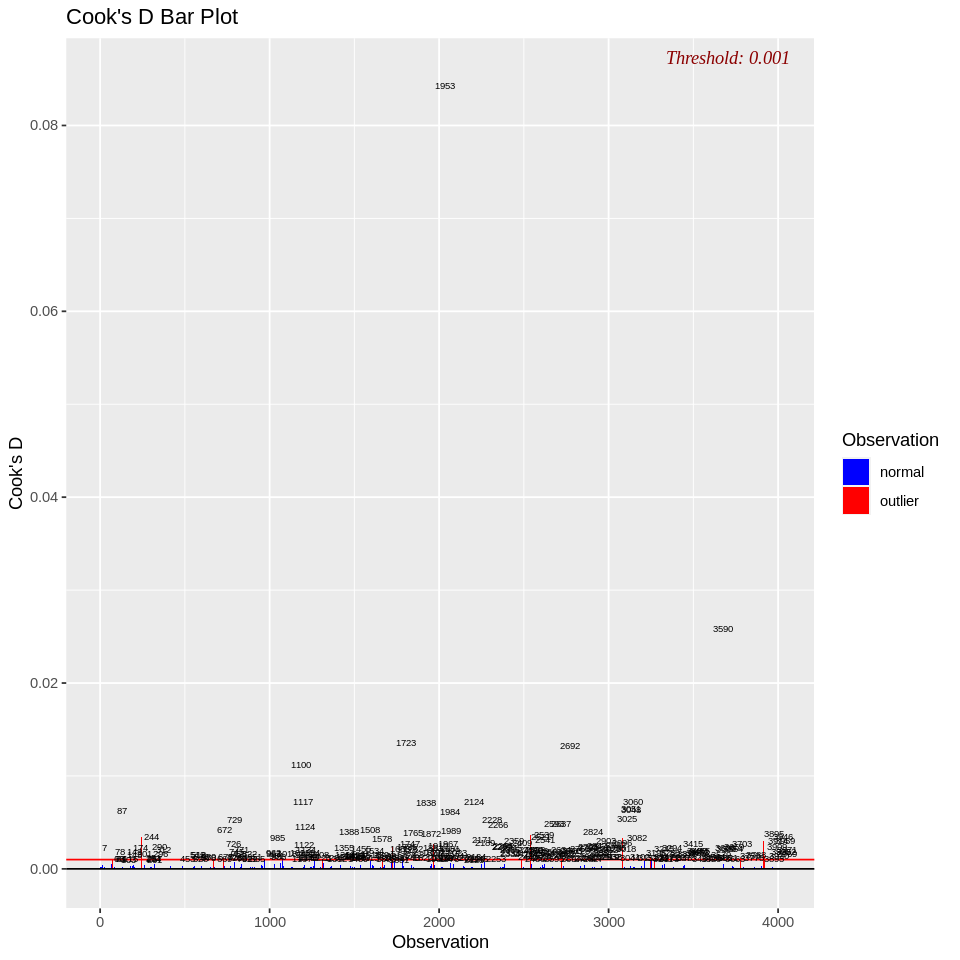

In [73]:
options(repr.plot.width=8, repr.plot.height=8)
ols_plot_cooksd_bar(fit_interaction1)

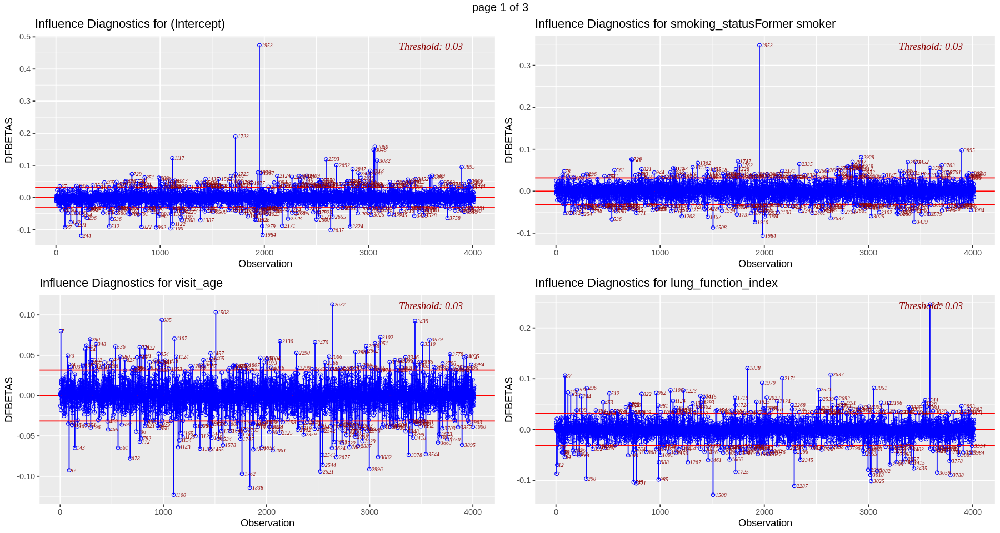

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL


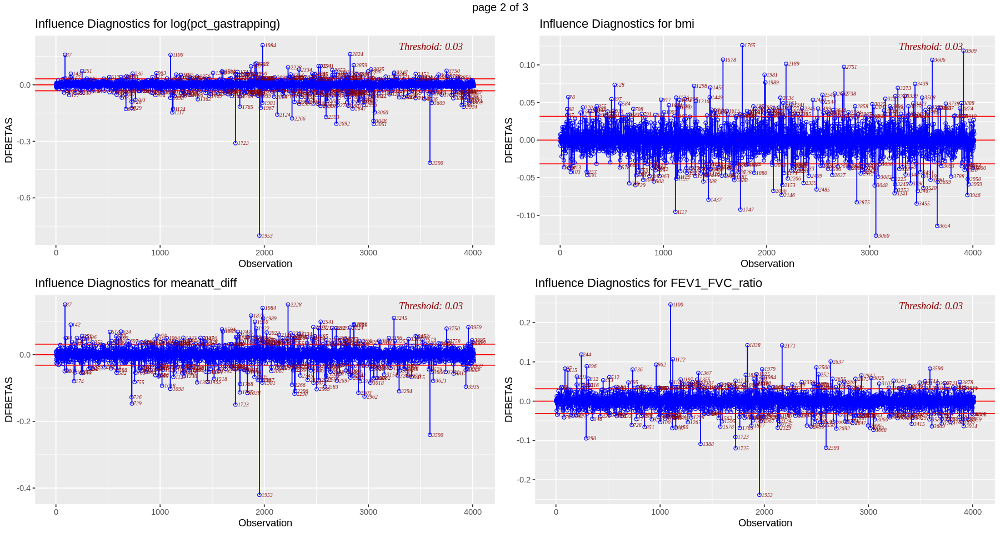

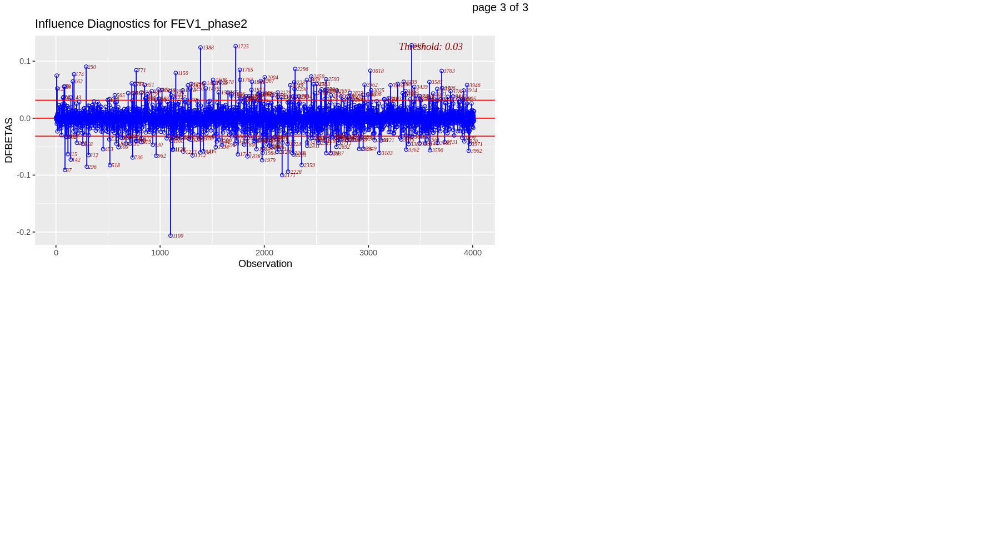

In [74]:
options(repr.plot.width=15, repr.plot.height=8)
ols_plot_dfbetas(fit_interaction1)

In [76]:
fit_tmp <- lm(summary(fit_interaction1)$call, data = copd3[-2228,])
summary(fit_tmp)


Call:
lm(formula = summary(fit_interaction1)$call, data = copd3[-2228, 
    ])

Residuals:
    Min      1Q  Median      3Q     Max 
-2.6340 -0.4285  0.0342  0.4587  4.5303 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 -2.8406528  0.1677582 -16.933   <2e-16 ***
visit_age                   -0.0140948  0.0015725  -8.963   <2e-16 ***
smoking_statusFormer smoker  0.3000843  0.0257516  11.653   <2e-16 ***
lung_function_index          0.1786294  0.0155413  11.494   <2e-16 ***
log(pct_gastrapping)         1.5661857  0.0189266  82.750   <2e-16 ***
meanatt_diff                 0.0229504  0.0004044  56.746   <2e-16 ***
bmi                         -0.0283472  0.0019574 -14.482   <2e-16 ***
FEV1_FVC_ratio              -3.1102473  0.1531758 -20.305   <2e-16 ***
FEV1_phase2                 -0.2190375  0.0241076  -9.086   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6938 o

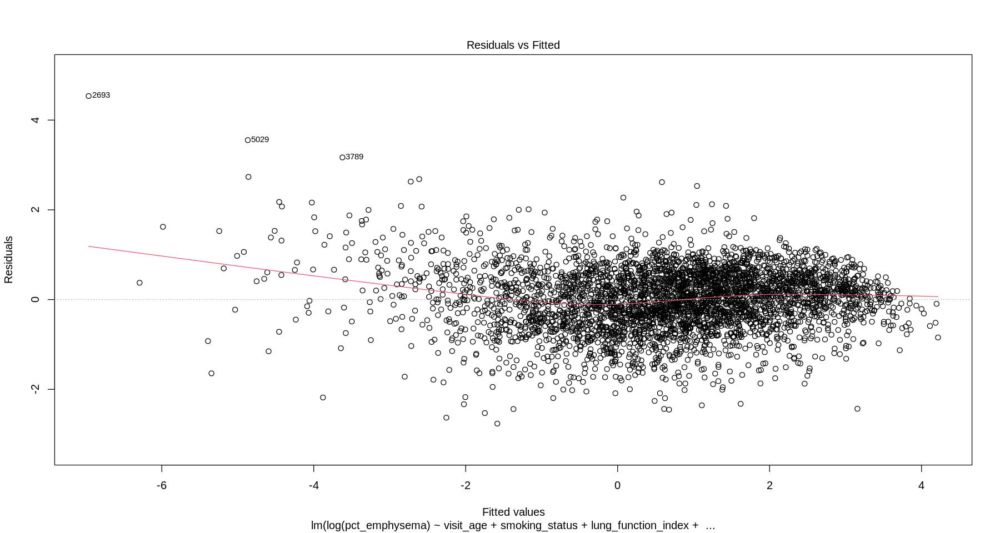

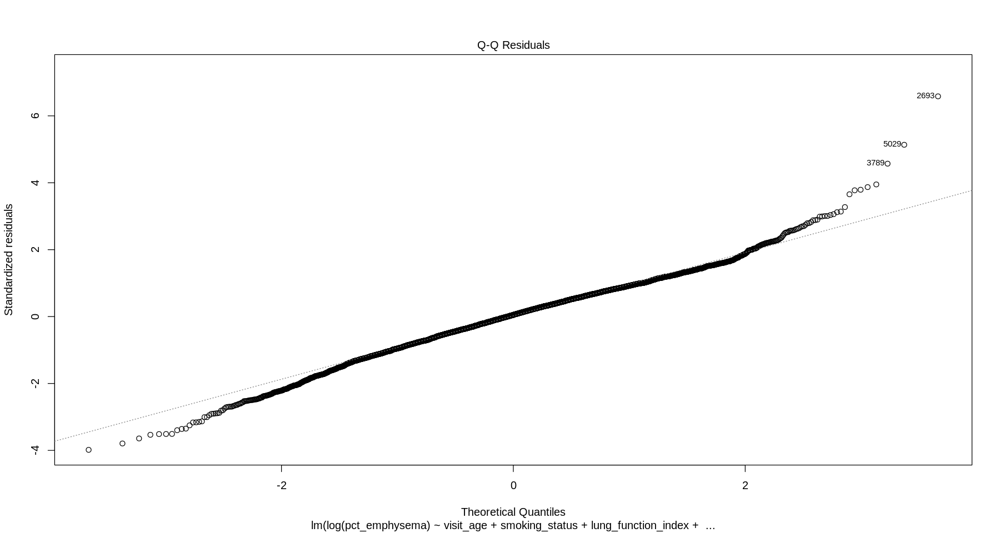

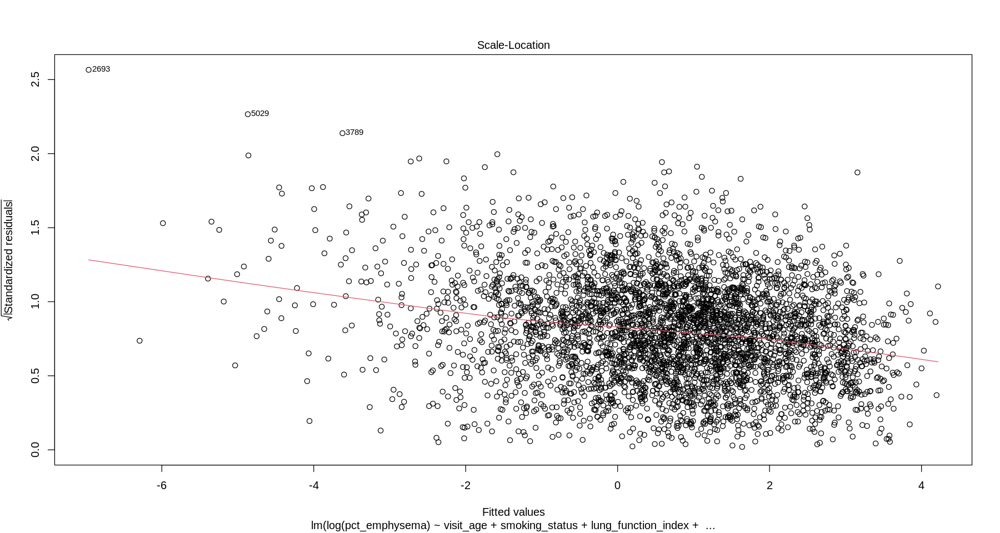

Warning message in plot.window(...):
“"id.method" is not a graphical parameter”
Warning message in plot.xy(xy, type, ...):
“"id.method" is not a graphical parameter”
Warning message in axis(side = side, at = at, labels = labels, ...):
“"id.method" is not a graphical parameter”
Warning message in axis(side = side, at = at, labels = labels, ...):
“"id.method" is not a graphical parameter”
Warning message in box(...):
“"id.method" is not a graphical parameter”
Warning message in title(...):
“"id.method" is not a graphical parameter”
Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“"id.method" is not a graphical parameter”


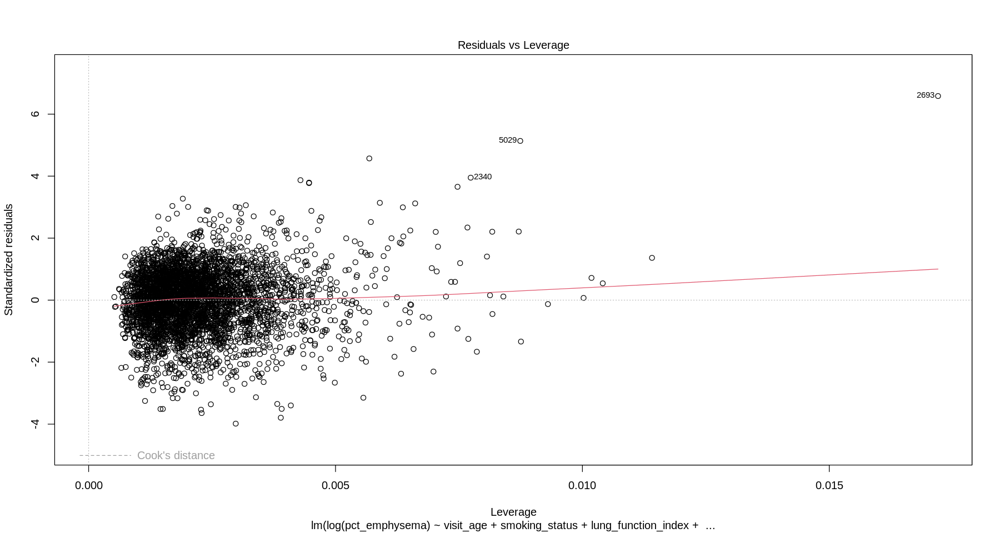

,StudRes,Hat,CookD
,<dbl>,<dbl>,<dbl>
2343,1.363704,0.011409559,0.002384279
2693,6.618303,0.017202265,0.084285792
5029,5.151801,0.008741406,0.025840949


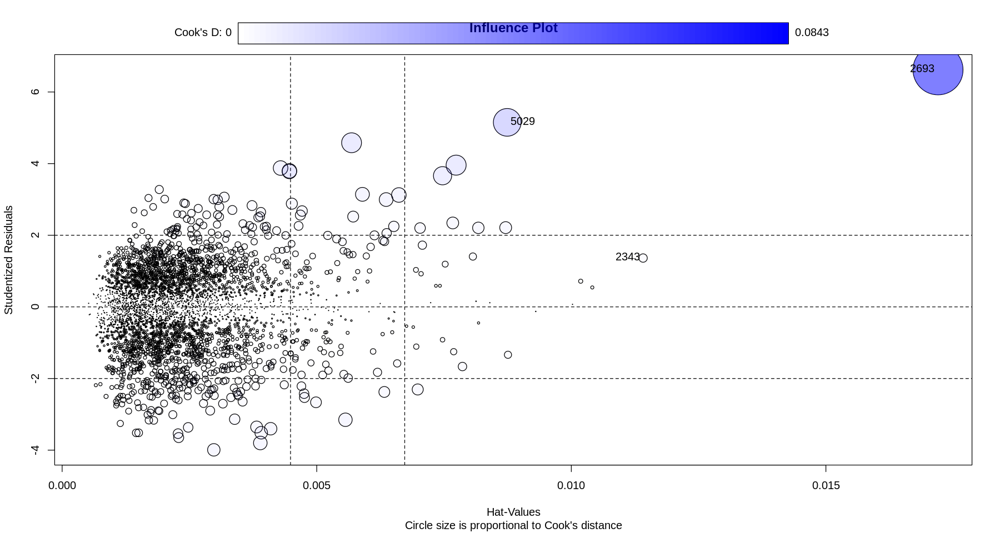

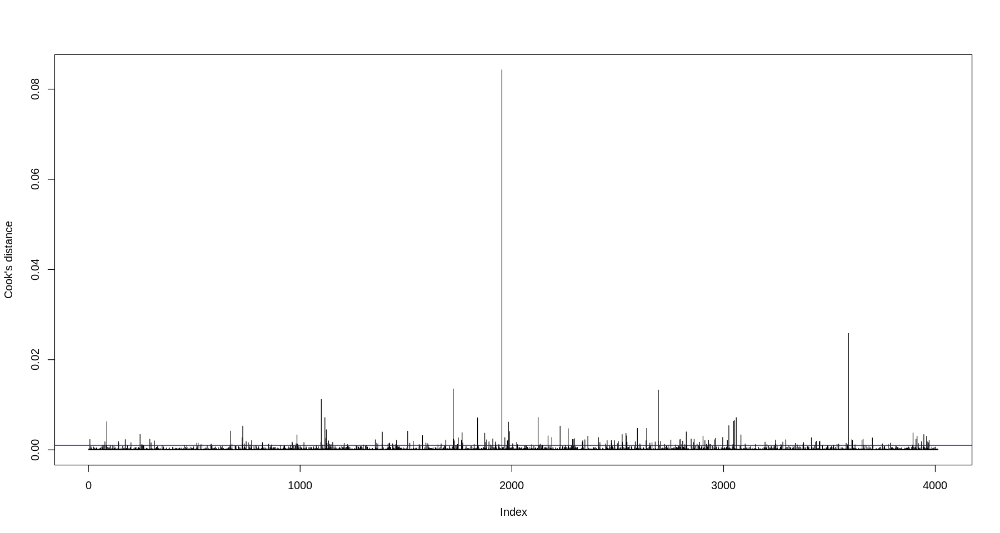

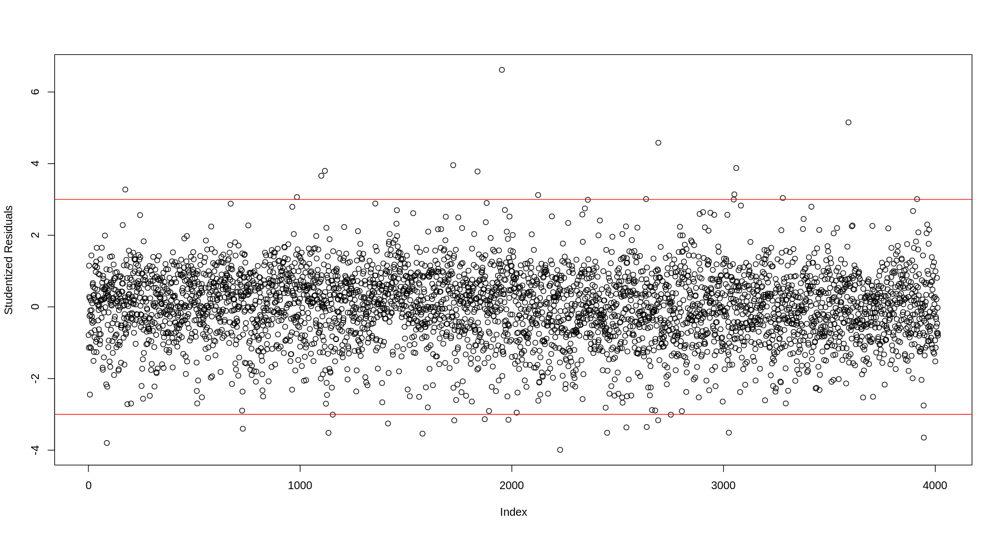

,visit_age,height_cm,weight_kg,O2_hours_day,bmi,hay_fever,bronchitis_attack,emphysema,copd,sleep_apnea,⋯,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2,transformed_response,meanatt_diff,lung_function_index
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
12,47.5,178.0,86.6,0,27.33,0,Yes,unknown,Yes,No,⋯,33.825500,-854.198,-778.834,0.45,1.718,3.796,1.127,1.49202212,75.364,6.63185
81,59.0,167.6,51.0,0,18.16,0,No,Yes,Yes,No,⋯,35.184000,-863.291,-786.574,0.38,1.982,5.250,1.129,2.34967445,76.717,6.74260
88,48.2,181.0,79.6,0,24.30,0,Yes,Yes,Yes,No,⋯,65.959800,-870.201,-842.607,0.29,0.819,2.834,0.562,3.07759646,27.594,7.08805
94,46.3,172.7,120.0,0,40.23,1,Yes,No,No,Yes,⋯,1.923250,-836.835,-617.809,0.82,4.264,5.214,4.129,1.27667537,219.026,4.74525
101,50.4,184.0,84.5,0,24.96,1,Yes,No,No,Yes,⋯,9.079680,-839.430,-687.176,0.62,2.663,4.266,1.802,0.91642676,152.254,5.37085
105,70.2,156.0,77.5,0,31.85,1,No,No,No,No,⋯,3.384890,-742.214,-640.507,0.69,1.902,2.754,1.657,0.08691766,101.707,2.49895
127,52.5,165.0,116.8,0,42.90,1,Yes,No,Yes,unknown,⋯,7.172560,-789.652,-587.638,0.72,1.521,2.111,1.711,0.99169300,202.014,2.96320
146,64.4,168.0,78.2,0,27.71,0,No,No,No,No,⋯,6.442250,-749.912,-615.733,0.52,2.158,4.189,2.032,0.60268234,134.179,2.67775
179,51.4,157.5,61.3,0,24.71,1,unknown,Yes,Yes,No,⋯,6.466030,-797.331,-712.488,0.82,2.846,3.462,3.106,0.21271883,84.843,2.62725


,visit_age,height_cm,weight_kg,O2_hours_day,bmi,hay_fever,bronchitis_attack,emphysema,copd,sleep_apnea,⋯,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2,transformed_response,meanatt_diff,lung_function_index
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
105,70.20,156.0,77.5,0,31.85,1,No,No,No,No,⋯,3.3848900,-742.214,-640.507,0.69,1.902,2.754,1.657,0.08691766,101.707,2.49895
222,56.60,170.2,73.0,0,25.20,0,No,Yes,No,No,⋯,22.3647000,-814.596,-742.379,0.73,2.716,3.726,2.848,3.23479520,72.217,4.49645
944,47.60,182.9,127.4,0,38.08,1,unknown,No,No,unknown,⋯,5.2142200,-788.680,-529.207,0.89,3.776,4.259,3.725,0.53580314,259.473,4.14260
1292,80.50,161.8,67.0,20,25.59,0,No,No,Yes,No,⋯,51.3294000,-843.873,-812.620,0.53,1.054,1.996,0.904,5.38277809,31.253,3.37935
1457,50.30,160.0,80.0,0,31.25,0,Yes,Yes,Yes,No,⋯,51.7296000,-826.176,-761.663,0.85,1.486,1.752,0.694,5.97916382,64.513,3.44095
1499,45.10,159.3,55.0,0,21.67,0,No,No,No,No,⋯,0.3365510,-846.130,-603.494,0.80,2.982,3.734,2.881,0.95409748,242.636,3.50820
1527,52.70,171.5,73.0,0,24.82,1,No,No,No,No,⋯,5.0909300,-696.829,-568.550,0.84,2.139,2.532,2.148,0.14874576,128.279,2.84850
1557,70.40,157.4,56.1,0,22.64,0,No,No,No,No,⋯,7.5398900,-826.118,-703.793,0.66,1.715,2.597,1.928,0.34694524,122.325,3.63875
1940,62.60,168.9,99.8,0,34.98,0,No,No,No,unknown,⋯,11.0406000,-795.012,-647.766,0.74,2.253,3.055,2.569,0.41237483,147.246,3.49880


,visit_age,height_cm,weight_kg,O2_hours_day,bmi,hay_fever,bronchitis_attack,emphysema,copd,sleep_apnea,⋯,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2,transformed_response,meanatt_diff,lung_function_index
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
14,48.7,153.7,86.2,24,36.49,0,Yes,Yes,Yes,Yes,⋯,47.881100,-836.281,-797.471,0.29,0.374,1.281,0.379,3.3738998,38.810,4.46300
17,64.6,179.0,88.8,0,27.71,0,Yes,No,Yes,No,⋯,50.860300,-864.847,-805.216,0.46,1.283,2.799,0.938,3.0376833,59.631,7.66290
37,58.7,183.0,90.0,0,26.87,0,unknown,unknown,Yes,No,⋯,61.440900,-887.808,-833.390,0.23,0.961,4.184,0.625,5.8202749,54.418,7.79570
70,59.8,192.3,84.9,0,22.96,1,Yes,unknown,unknown,unknown,⋯,66.488500,-884.179,-848.334,0.28,1.352,4.761,1.050,5.2171256,35.845,8.79435
88,48.2,181.0,79.6,0,24.30,0,Yes,Yes,Yes,No,⋯,65.959800,-870.201,-842.607,0.29,0.819,2.834,0.562,3.0775965,27.594,7.08805
128,55.4,171.0,67.0,0,22.91,0,No,No,No,No,⋯,3.056870,-737.219,-665.786,0.73,3.122,4.277,2.874,0.2363516,71.433,2.93365
137,77.9,173.0,110.0,0,36.75,1,unknown,No,Yes,No,⋯,19.837300,-763.462,-713.941,0.47,0.884,1.891,1.124,1.2327490,49.521,3.33340
146,64.4,168.0,78.2,0,27.71,0,No,No,No,No,⋯,6.442250,-749.912,-615.733,0.52,2.158,4.189,2.032,0.6026823,134.179,2.67775
161,54.9,158.8,61.0,0,24.19,0,Yes,No,No,No,⋯,0.326102,-791.539,-601.808,0.82,2.566,3.119,2.332,0.1662880,189.731,2.90150



Call:
lm(formula = log(pct_emphysema) ~ ., data = clean_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.5329 -0.2633  0.0968  0.3622  2.9365 

Coefficients: (2 not defined because of singularities)
                               Estimate Std. Error t value Pr(>|t|)    
(Intercept)                  -1.629e+01  1.060e+00 -15.367  < 2e-16 ***
visit_age                     8.556e-03  1.366e-03   6.264 4.18e-10 ***
height_cm                     6.402e-03  5.274e-03   1.214 0.224864    
weight_kg                     4.827e-03  5.107e-03   0.945 0.344616    
O2_hours_day                 -8.703e-03  2.398e-03  -3.629 0.000288 ***
bmi                           1.852e-02  1.459e-02   1.270 0.204292    
hay_fever                     6.174e-03  1.110e-02   0.556 0.578042    
bronchitis_attackunknown      8.443e-02  3.473e-02   2.431 0.015093 *  
bronchitis_attackYes         -2.199e-02  2.063e-02  -1.066 0.286504    
emphysemaunknown              1.023e-01  4.042e-02   2.529 0.011463


Call:
lm(formula = log(pct_emphysema) ~ visit_age + smoking_status + 
    lung_function_index + log(pct_gastrapping) + meanatt_diff + 
    bmi + FEV1_FVC_ratio + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7648 -0.4285  0.0340  0.4591  4.5362 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 -2.8516756  0.1680479 -16.969   <2e-16 ***
visit_age                   -0.0140601  0.0015754  -8.925   <2e-16 ***
smoking_statusFormer smoker  0.3003796  0.0257995  11.643   <2e-16 ***
lung_function_index          0.1785611  0.0155703  11.468   <2e-16 ***
log(pct_gastrapping)         1.5679449  0.0189567  82.712   <2e-16 ***
meanatt_diff                 0.0230113  0.0004049  56.831   <2e-16 ***
bmi                         -0.0282709  0.0019610 -14.417   <2e-16 ***
FEV1_FVC_ratio              -3.1118463  0.1534605 -20.278   <2e-16 ***
FEV1_phase2                 -0.2212992  0.0241458  -9.165   <2

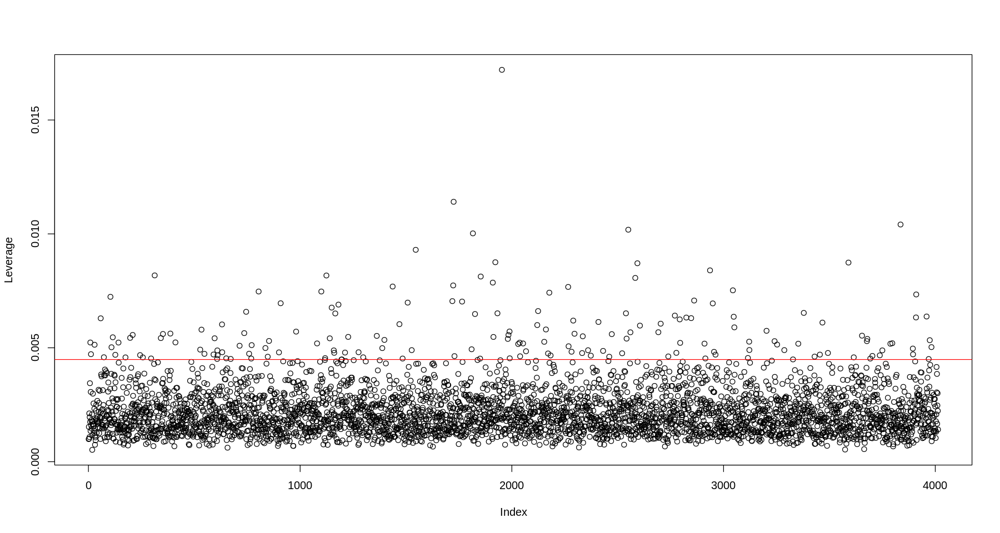

In [77]:

# Plot standard diagnostic plots
plot(fit_interaction1)

# Create an influence plot to visualize leverage, studentized residuals, and Cook's distance
influencePlot(fit_interaction1, id.method="identify", main="Influence Plot", sub="Circle size is proportional to Cook's distance")

# Calculate Cook's distance for each observation
cooks.distance <- cooks.distance(fit_interaction1)

# Plot Cook's distance
plot(cooks.distance, ylab="Cook's distance", type="h")
abline(h = 4/(nrow(copd3)-length(fit_interaction1$coefficients)-2), col="blue") # Rule of thumb threshold

# Identify observations with high Cook's distance
high_cooks <- which(cooks.distance > (4/(nrow(copd3)-length(fit_interaction1$coefficients)-2)))

# Identify studentized residuals
stud_res <- rstudent(fit_interaction1)

# Plot studentized residuals
plot(stud_res, ylab="Studentized Residuals")
abline(h = c(-3, 3), col="red") # Common thresholds for outliers

# Identify observations with high studentized residuals
high_stud_res <- which(abs(stud_res) > 3)

# Identify leverage points
hat_values <- hatvalues(fit_interaction1)

# Plot leverage
plot(hat_values, ylab="Leverage")
abline(h = 2*mean(hat_values), col="red") # Common threshold for high leverage

# Identify observations with high leverage
high_leverage <- which(hat_values > (2*mean(hat_values)))

# Review the observations that are outliers, have high leverage, or are influential
copd3[high_cooks, ]
copd3[high_stud_res, ]
copd3[high_leverage, ]

# Decide on actions: If these points are errors, consider removing them; if they're valid, consider keeping them
# For example, to remove high leverage points:
clean_data <- copd3[-high_leverage, ]

# Re-fit the model with the cleaned data if necessary
clean_fit <- lm(log(pct_emphysema) ~ ., data = clean_data)

# Compare the new fit to the original
summary(clean_fit)
summary(fit_interaction1)


The diagnostic information provided suggests that your linear regression model, fit_interaction1, had three notable observations. These were identified by their studentized residuals, leverage, and Cook's distance:

Observation 2343: Has a slightly high studentized residual and leverage but a low Cook's distance, indicating it may not be overly influential.
Observation 2693: Exhibits a very high studentized residual, high leverage, and the highest Cook's distance among the three, suggesting it is potentially a highly influential point.
Observation 5029: Also shows a high studentized residual and moderate leverage with a significant Cook's distance, indicating influence.

In [111]:
fit_tmp <- lm(summary(fit_interaction1)$call, data = copd3[-2343,-2693,-5029])
summary(fit_tmp)


Call:
lm(formula = summary(fit_interaction1)$call, data = copd3[-2343, 
    -2693, -5029])

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7645 -0.4288  0.0338  0.4590  4.5354 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 -2.8524904  0.1680508 -16.974   <2e-16 ***
visit_age                   -0.0140257  0.0015758  -8.901   <2e-16 ***
smoking_statusFormer smoker  0.2998671  0.0258049  11.621   <2e-16 ***
lung_function_index          0.1785793  0.0155703  11.469   <2e-16 ***
log(pct_gastrapping)         1.5676466  0.0189593  82.685   <2e-16 ***
meanatt_diff                 0.0230089  0.0004049  56.824   <2e-16 ***
bmi                         -0.0282440  0.0019612 -14.402   <2e-16 ***
FEV1_FVC_ratio              -3.1131114  0.1534667 -20.285   <2e-16 ***
FEV1_phase2                 -0.2213480  0.0241460  -9.167   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard err

###<font> Regression Analysis & Diagnosis without and with missing values model </font>

In [99]:
copd2_clean <- na.omit(select(copd, -sid, -visit_year, -visit_date))
copd3wmiss<-select(copd2_clean, -gender, -height_cm, -sysBP, ,-diasBP, -hr, -hay_fever, -pneumonia, -emphysema,
                        -race, -weight_kg, -diasBP, -asthma, -chronic_bronchitis, -copd, -SmokStartAge,
                        -CigPerDaySmokAvg, -Duration_Smoking)

In [100]:
summary(copd3wmiss)

   visit_age      O2_hours_day         bmi        bronchitis_attack 
 Min.   :40.60   Min.   : 0.000   Min.   :13.00   Length:4013       
 1st Qu.:53.20   1st Qu.: 0.000   1st Qu.:24.69   Class :character  
 Median :60.30   Median : 0.000   Median :28.17   Mode  :character  
 Mean   :60.29   Mean   : 1.079   Mean   :29.02                     
 3rd Qu.:66.70   3rd Qu.: 0.000   3rd Qu.:32.30                     
 Max.   :85.00   Max.   :24.000   Max.   :55.18                     
 sleep_apnea        smoking_status     total_lung_capacity pct_emphysema     
 Length:4013        Length:4013        Min.   : 2.109      Min.   : 0.00092  
 Class :character   Class :character   1st Qu.: 4.623      1st Qu.: 0.63514  
 Mode  :character   Mode  :character   Median : 5.465      Median : 2.20056  
                                       Mean   : 5.636      Mean   : 5.79774  
                                       3rd Qu.: 6.579      3rd Qu.: 6.69658  
                                       Max.   :11

In [104]:
copd3wmiss$meanatt_diff <- with(copd3wmiss, exp_meanatt - insp_meanatt)


In [105]:
# Assuming total_lung_capacity and functional_residual_capacity are on the same scale
copd3wmiss$lung_function_index <- with(copd3wmiss, (total_lung_capacity + functional_residual_capacity) / 2)


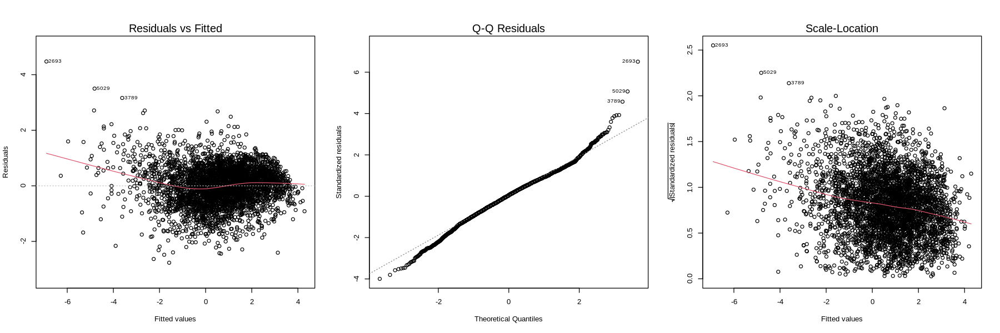

In [106]:
fit_final_clean <- lm(log(pct_emphysema) ~ visit_age + smoking_status +
                      total_lung_capacity + log(pct_gastrapping) +
                       meanatt_diff+ bmi+
                       FEV1_FVC_ratio +
                      FEV1_phase2, data = copd3wmiss)

options(repr.plot.width=15, repr.plot.height=5)
par(mfrow = c(1,3))
plot(fit_final_clean, which = 1:3)

In [107]:
# serial correlation test
durbinWatsonTest(fit_final_clean)

 lag Autocorrelation D-W Statistic p-value
   1      0.03599563      1.927705   0.026
 Alternative hypothesis: rho != 0

In [108]:
# serial correlation test
durbinWatsonTest(fit_interaction1)

 lag Autocorrelation D-W Statistic p-value
   1      0.03554443      1.928598   0.022
 Alternative hypothesis: rho != 0

# The missing values did not have huge impact on the autocorrelation in the copd dataset.

# Added Variable Plots

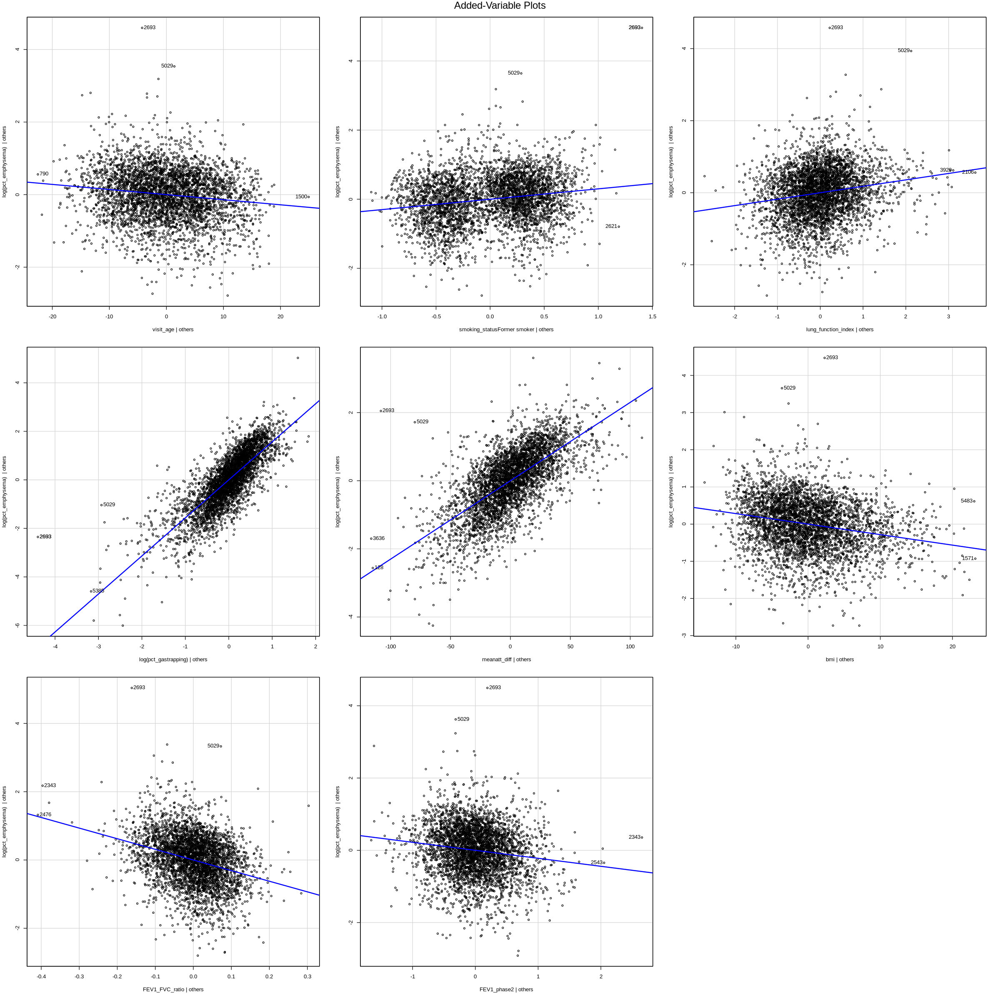

In [112]:
options(repr.plot.width=20, repr.plot.height=20)
avPlots(fit_interaction1)

# Results - Interpretation of Regression Estimates

In [113]:
fit_final <- lm(log(pct_emphysema) ~ visit_age + smoking_status +
                      total_lung_capacity + log(pct_gastrapping) +
                       meanatt_diff+ bmi+
                       FEV1_FVC_ratio +
                      FEV1_phase2,
                  data = copd3)
summary(fit_final)


Call:
lm(formula = log(pct_emphysema) ~ visit_age + smoking_status + 
    total_lung_capacity + log(pct_gastrapping) + meanatt_diff + 
    bmi + FEV1_FVC_ratio + FEV1_phase2, data = copd3)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7676 -0.4286  0.0300  0.4618  4.4758 

Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 -2.7045526  0.1600623 -16.897   <2e-16 ***
visit_age                   -0.0146328  0.0015772  -9.278   <2e-16 ***
smoking_statusFormer smoker  0.2929627  0.0256867  11.405   <2e-16 ***
total_lung_capacity          0.1491892  0.0122856  12.143   <2e-16 ***
log(pct_gastrapping)         1.5518686  0.0191511  81.033   <2e-16 ***
meanatt_diff                 0.0218757  0.0004049  54.025   <2e-16 ***
bmi                         -0.0273770  0.0019575 -13.985   <2e-16 ***
FEV1_FVC_ratio              -3.0432318  0.1536723 -19.803   <2e-16 ***
FEV1_phase2                 -0.2454455  0.0248533  -9.876   <2

# Interpretations

The output of the lm function provides a summary of the linear regression model that predicts the natural logarithm of the percentage of emphysema (log(pct_emphysema)) using various predictors. Here's a detailed interpretation and statistical analysis:

 **Model Summary**

Coefficients: The estimates for the regression coefficients indicate the expected change in the dependent variable (log(pct_emphysema)) for a one-unit change in the predictor variable, holding all other predictors constant.

Intercept: The estimated value of -2.7046 suggests that when all predictors are zero, the expected value of log(pct_emphysema) is approximately -2.7046.

visit_age: The coefficient of -0.0146 indicates that for each additional year of age, the expected value of log(pct_emphysema) decreases by approximately 0.0146, suggesting older individuals have a lower percentage of emphysema when logged.

smoking_statusFormer smoker: Being a former smoker is associated with an increase in log(pct_emphysema) of 0.2930, controlling for other factors.

total_lung_capacity: The positive coefficient of 0.1492 suggests that greater total lung capacity is associated with higher log(pct_emphysema) values.

log(pct_gastrapping): A coefficient of 1.5519 is quite large, indicating a strong positive association between pct_gastrapping and log(pct_emphysema).

meanatt_diff: The coefficient 0.0219 implies that a unit difference between expiratory and inspiratory mean attenuation is associated with an increase in log(pct_emphysema).

bmi: The negative coefficient of -0.0274 suggests that higher body mass index (BMI) is associated with a lower log(pct_emphysema).

FEV1_FVC_ratio: The negative coefficient of -3.0432 indicates that a higher FEV1/FVC ratio is strongly associated with lower log(pct_emphysema).

FEV1_phase2: The negative coefficient of -0.2454 suggests that for each unit increase in FEV1_phase2, there is a decrease in log(pct_emphysema).

**Significance Tests**


All predictors have very small p-values (<2e-16 for most), meaning that these predictors are statistically significant and unlikely to have a coefficient of zero. This suggests a strong relationship between each predictor and the outcome variable.

**Model Fit**

Residual Standard Error (RSE): An RSE of 0.6937 suggests the model's predictions are, on average, within 0.6937 units of the actual log percentage of emphysema values.


Multiple R-squared: A value of 0.8286 means that approximately 82.86% of the variability in log(pct_emphysema) is explained by the model. This indicates a good fit.


Adjusted R-squared: At 0.8283, it is very close to the R-squared value, indicating that the model is not being penalized for any unnecessary complexity. It is also a good indicator of fit.


F-statistic: An F-statistic of 2420 and a p-value < 2.2e-16 indicate the model as a whole is statistically significant.